In [39]:
# Standard library imports
import os
import importlib
import warnings
from math import atanh, tanh, sqrt

# Data manipulation libraries
import pandas as pd
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import scienceplots

# Progress bar
import tqdm.notebook as tqdm

# Deep learning & image processing libraries
import torch
import SimpleITK as sitk

# Statistical libraries
from scipy import stats
from scipy.stats import pearsonr
from scipy.interpolate import interp1d

# Survival analysis libraries
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

# Scikit-learn libraries
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
from sklearn.model_selection import (
    train_test_split, RandomizedSearchCV, StratifiedKFold, GridSearchCV
)
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import (
    RandomForestClassifier, ExtraTreesClassifier, AdaBoostClassifier, 
    GradientBoostingClassifier, StackingClassifier
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import (
    confusion_matrix, classification_report, accuracy_score, balanced_accuracy_score,
    roc_auc_score, f1_score, precision_score, recall_score, precision_recall_curve, auc
)

# Gradient boosting libraries
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Imbalanced learning libraries
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from imblearn.pipeline import Pipeline as ImbPipeline

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Set random seed for reproducibility
random_seed = 42
np.random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)

# Configure matplotlib settings
plt.style.use(['science', 'grid'])
plt.rcParams['figure.dpi'] = 500
plt.rcParams.update({
    'font.size': 16,
    'axes.titlesize': 22,
    'axes.labelsize': 16,
    'xtick.labelsize': 16,
    'ytick.labelsize': 16,
})
# Load test patient IDs
test_ids = pd.read_csv('survival_test_patient_ids.csv')['patient_id'].tolist()
print("Test set patient ids:", test_ids)

Test set patient ids: [110, 118, 171, 77, 18, 35, 166, 14, 72, 115, 105, 28, 112, 125, 59, 71, 3, 53]


## 1. Data analysis

In [40]:
# load the clinical data
clinical_data = pd.read_csv('Burdenko-GBM-clinical-data.csv')
print(clinical_data.head())

    AnonymPatientID AnonymStudyDate Sex    IDH1/2      MGMT Response_1st_fup  \
0  Burdenko-GBM-001          5/6/04   F  negative  negative         response   
1  Burdenko-GBM-002          9/9/04   M  positive  positive         response   
2  Burdenko-GBM-003          9/8/04   M       NaN       NaN      progression   
3  Burdenko-GBM-004          9/5/04   F  negative  positive           stable   
4  Burdenko-GBM-005         9/11/04   F  negative  negative           stable   

  Response_2nd_fup Response_3rd_fup Response_4th_fup Response_5th_fup  \
0           stable           stable           stable           stable   
1         response      progression              NaN              NaN   
2              NaN              NaN              NaN              NaN   
3      progression      progression              NaN              NaN   
4              NaN              NaN              NaN              NaN   

  Response_6th_fup Response_7th_fup Response_8th_fup Response_9th_fup  \
0      

Number of patients in the dataset: 180
Number of patients with age information: 178
Number of patients with sex information: 178


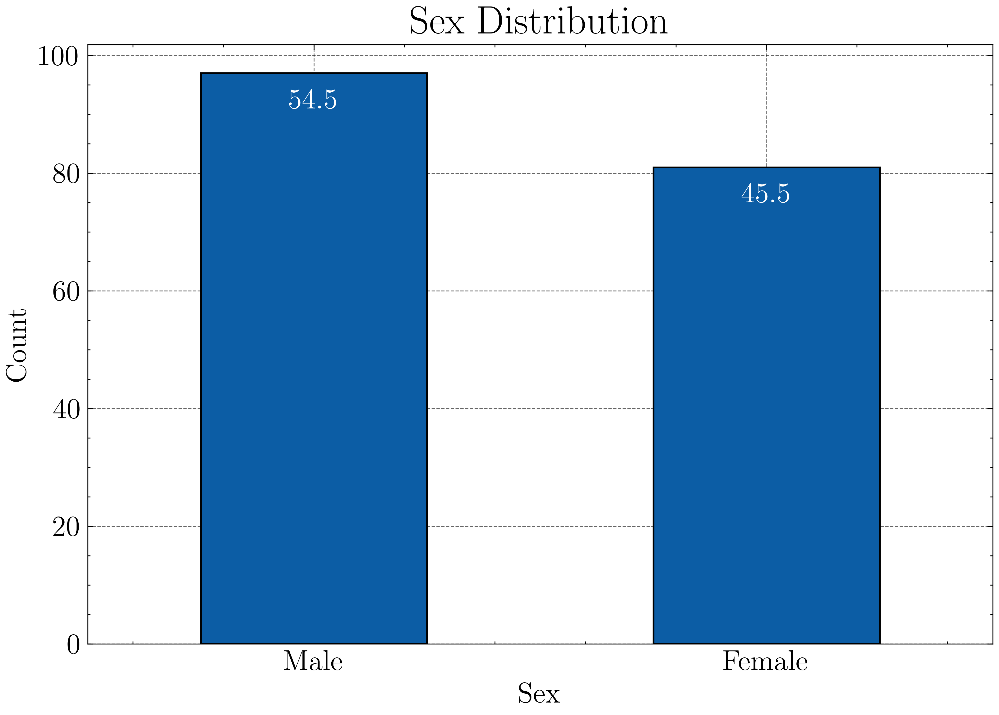

Sex counts:
Sex
M    97
F    81
Name: count, dtype: int64

Sex proportions:
Sex
M    0.544944
F    0.455056
Name: count, dtype: float64


In [41]:
print(f"Number of patients in the dataset: {clinical_data.shape[0]}")
# Filter out patients with missing age or sex information from the clinical_data DataFrame
clinical_data = clinical_data[
    clinical_data['AgeAtStudyDate'].notna() & clinical_data['Sex'].notna()
]

# Print dataset statistics after filtering
print(f"Number of patients with age information: {clinical_data['AgeAtStudyDate'].notna().sum()}")
print(f"Number of patients with sex information: {clinical_data['Sex'].notna().sum()}")

# Calculate the count and proportion of each sex in the dataset
sex_counts = clinical_data['Sex'].value_counts(dropna=True)
sex_proportions = sex_counts / sex_counts.sum()

# Create a bar chart to visualize the sex distribution
fig, ax = plt.subplots(figsize=(9, 6))
sex_counts.plot(kind='bar', ax=ax, edgecolor='black')
ax.set_title('Sex Distribution')
ax.set_xlabel('Sex')
ax.set_ylabel('Count')
ax.tick_params(axis='x', rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Set custom x-axis tick labels (assuming the original order corresponds to Male and Female)
ax.set_xticklabels(['Male', 'Female'])

# Add percentage labels on top of each bar
for i, count in enumerate(sex_counts):
    percentage = sex_proportions[i] * 100
    ax.text(i, count - 7, f'{percentage:.1f}%', ha='center', va='bottom', color='white')

# Display the plot
plt.show()

# Save the plot as a PDF file
output_path = 'Bilder/sex_distribution_dataset.pdf'
fig.savefig(output_path, format='pdf')

# Print the raw counts and proportions for reference
print("Sex counts:")
print(sex_counts)
print("\nSex proportions:")
print(sex_proportions)


Average age: 55.25 years (95% CI: 53.35 - 57.14)
Median age: 57.00 years


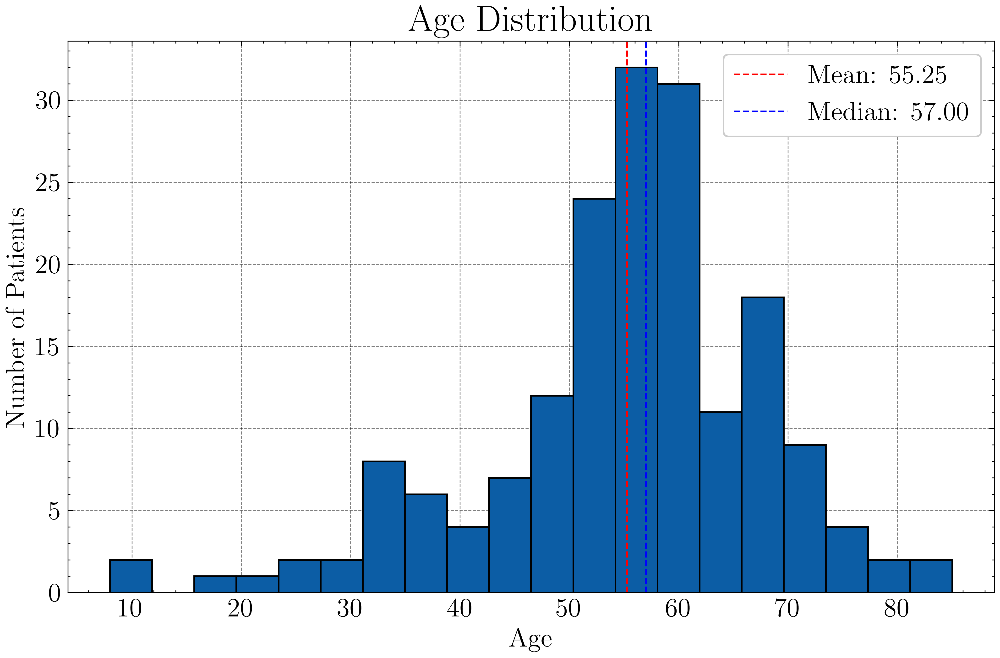

In [42]:
# Calculate the average and median age
average_age = clinical_data['AgeAtStudyDate'].mean()
median_age = clinical_data['AgeAtStudyDate'].median()
# Calculate the standard error and confidence interval for the mean age
n = clinical_data['AgeAtStudyDate'].notna().sum()
std_err = clinical_data['AgeAtStudyDate'].std() / np.sqrt(n)
confidence_interval = stats.t.interval(0.95, df=n-1, loc=average_age, scale=std_err)

# Display the results with uncertainty
print(f"Average age: {average_age:.2f} years (95% CI: {confidence_interval[0]:.2f} - {confidence_interval[1]:.2f})")
print(f"Median age: {median_age:.2f} years")
# Mark the mean and median on the plot
# Plot histogram of age
plt.figure(figsize=(10, 6))
plt.hist(clinical_data['AgeAtStudyDate'].dropna(), bins=20, edgecolor='black')
plt.axvline(average_age, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {average_age:.2f}')
plt.axvline(median_age, color='blue', linestyle='dashed', linewidth=1, label=f'Median: {median_age:.2f}')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Number of Patients')
plt.legend()
output_path = 'Bilder/age_distribution_dataset.pdf'
plt.savefig(output_path, format='pdf')
plt.show()

## Follow-up filtering
Removing patients with follow-up conducted too soon or too late after RT


Example rows after computing follow-up metrics:
    AnonymPatientID AnonymStudyDate AnonymEnd of RT FirstValidFollowUp  \
0  Burdenko-GBM-001      2004-05-06      2004-06-27         2004-07-08   
1  Burdenko-GBM-002      2004-09-09      2005-02-25         2005-03-30   
2  Burdenko-GBM-003      2004-09-08      2004-10-28         2004-11-26   
3  Burdenko-GBM-004      2004-09-05      2004-10-28         2004-11-17   
4  Burdenko-GBM-005      2004-09-11      2004-10-28         2004-11-18   

   FirstFollowUpNumber  DaysToFirstValidFollowUp LastValidFollowUp  \
0                  1.0                      63.0        2005-03-30   
1                  2.0                     202.0        2005-06-17   
2                  1.0                      79.0        2004-11-26   
3                  1.0                      73.0        2005-03-23   
4                  1.0                      68.0        2004-11-18   

   DaysFromRTToLastFollowUp  
0                     328.0  
1                     281

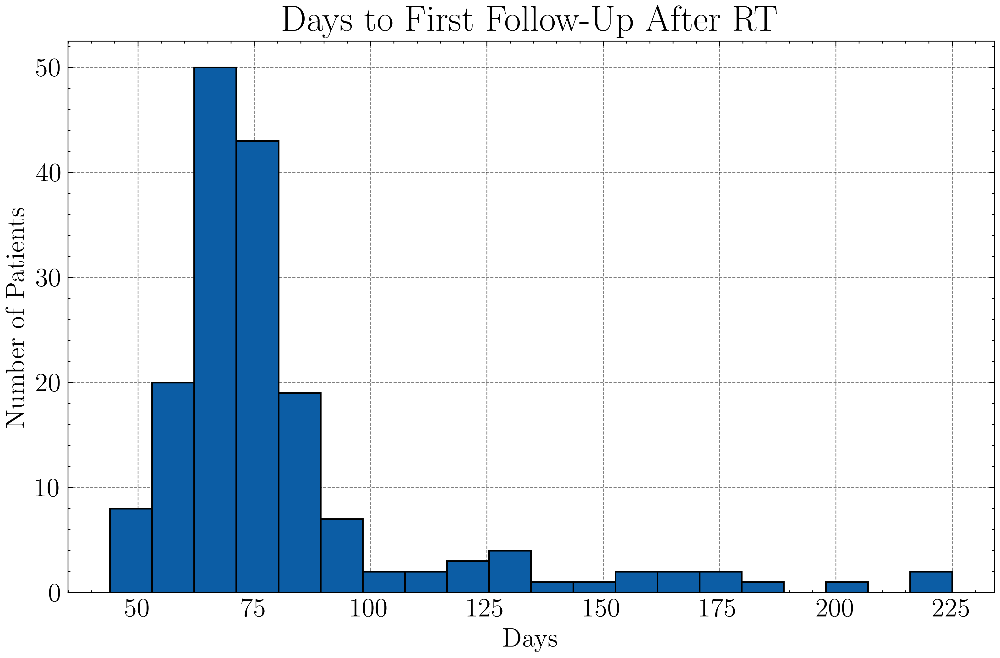

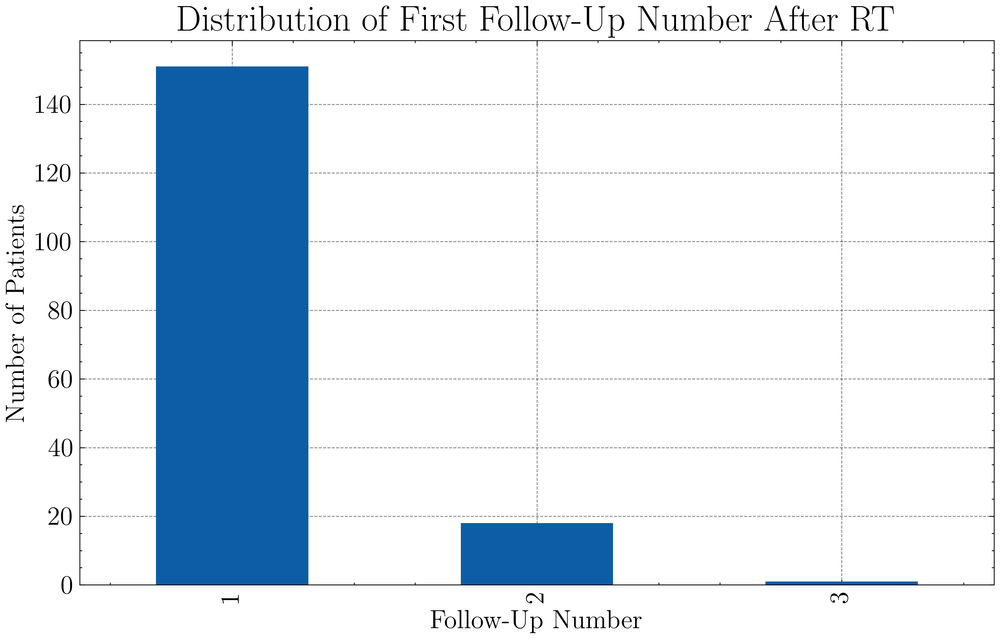

Average days to first follow-up after RT: 81.44 days (95% CI: 76.75 - 86.12)
Median days to first follow-up after RT: 72.50 days


In [43]:
# =============================================================================
# 1. Define and Convert Date Columns
# =============================================================================
# List of all relevant date columns from the clinical dataset
date_columns = [
    'AnonymStudyDate', 'AnonymStart of RT', 'AnonymEnd of RT', 'AnonymDate of surgery'
] + [
    'Anonym1st_fup', 'Anonym2nd_fup', 'Anonym3rd_fup', 'Anonym4th_fup',
    'Anonym5th_fup', 'Anonym6th_fup', 'Anonym7th_fup', 'Anonym8th_fup',
    'Anonym9th_fup', 'Anonym10th_fup'
]

# Convert the defined columns to datetime format, coercing any errors to NaT
for col in date_columns:
    clinical_data[col] = pd.to_datetime(clinical_data[col], format='%m/%d/%y', errors='coerce')


# =============================================================================
# 2. Define Follow-Up Columns and Helper Functions
# =============================================================================
# List of columns representing follow-up dates
follow_up_columns = [
    'Anonym1st_fup', 'Anonym2nd_fup', 'Anonym3rd_fup', 'Anonym4th_fup', 
    'Anonym5th_fup', 'Anonym6th_fup', 'Anonym7th_fup', 'Anonym8th_fup', 
    'Anonym9th_fup', 'Anonym10th_fup'
]

def get_first_follow_up_after_rt(row, follow_up_cols):
    """
    Return the first follow-up date after the end of radiotherapy (RT) for a given row.
    If 'AnonymEnd of RT' is missing or no follow-up exists after RT, return NaN.
    """
    end_of_rt = row['AnonymEnd of RT']
    if pd.isnull(end_of_rt):
        return np.nan
    # Filter for follow-up dates that are after the end of RT
    follow_ups_after_rt = row[follow_up_cols][row[follow_up_cols] > end_of_rt]
    return follow_ups_after_rt.min() if not follow_ups_after_rt.empty else np.nan

def get_last_follow_up_after_rt(row, follow_up_cols):
    """
    Return the last follow-up date after the end of radiotherapy (RT) for a given row.
    If 'AnonymEnd of RT' is missing or no follow-up exists after RT, return NaN.
    """
    end_of_rt = row['AnonymEnd of RT']
    if pd.isnull(end_of_rt):
        return np.nan
    follow_ups_after_rt = row[follow_up_cols][row[follow_up_cols] > end_of_rt]
    return follow_ups_after_rt.max() if not follow_ups_after_rt.empty else np.nan

def get_first_follow_up_number(row, follow_up_cols):
    """
    Determine the follow-up number (1st, 2nd, etc.) corresponding to the first follow-up date 
    after the end of RT. Returns NaN if there is no valid follow-up.
    """
    end_of_rt = row['AnonymEnd of RT']
    if pd.isnull(end_of_rt):
        return np.nan
    # Loop over follow-up columns in order and return the index of the first valid follow-up date
    for idx, col in enumerate(follow_up_cols, start=1):
        fup_date = row[col]
        if pd.notnull(fup_date) and fup_date > end_of_rt:
            return idx
    return np.nan


# =============================================================================
# 3. Calculate Follow-Up Dates and Numbers
# =============================================================================
# Apply functions to calculate the first and last valid follow-up dates after RT
clinical_data['FirstValidFollowUp'] = clinical_data.apply(
    lambda row: get_first_follow_up_after_rt(row, follow_up_columns), axis=1
)
clinical_data['LastValidFollowUp'] = clinical_data.apply(
    lambda row: get_last_follow_up_after_rt(row, follow_up_columns), axis=1
)
clinical_data['FirstFollowUpNumber'] = clinical_data.apply(
    lambda row: get_first_follow_up_number(row, follow_up_columns), axis=1
)

# Calculate the number of days from the study date to the first valid follow-up
clinical_data['DaysToFirstValidFollowUp'] = (
    clinical_data['FirstValidFollowUp'] - clinical_data['AnonymStudyDate']
).dt.days

# Calculate the number of days from the study date to the last valid follow-up after RT
clinical_data['DaysFromRTToLastFollowUp'] = (
    clinical_data['LastValidFollowUp'] - clinical_data['AnonymStudyDate']
).dt.days


# =============================================================================
# 4. Filter Patients Based on Follow-Up Time Criteria
# =============================================================================
# Define follow-up time limits (minimum 14 days and maximum 365 days)
min_days = 14
max_days = 365

# Filter out patients with invalid or out-of-bound follow-up time values
clinical_data_filtered = clinical_data[
    (clinical_data['DaysToFirstValidFollowUp'] >= min_days) & 
    (clinical_data['DaysToFirstValidFollowUp'] <= max_days) &
    (clinical_data['DaysToFirstValidFollowUp'].notnull()) &
    (clinical_data['DaysFromRTToLastFollowUp'] >= 0) &
    (clinical_data['DaysFromRTToLastFollowUp'].notnull())
]

# Update clinical_data with the filtered dataset
clinical_data = clinical_data_filtered.copy()


# =============================================================================
# 5. Additional Calculations and Filtering: Surgery and RT Timing
# =============================================================================
# Calculate the number of days between the date of surgery and the start of RT
clinical_data['Days_between_surgery_and_RT'] = (
    clinical_data['AnonymStart of RT'] - clinical_data['AnonymDate of surgery']
).dt.days

# Remove patients where RT started before surgery (i.e., negative difference. This occurs in 2 patients, and they are removed)
clinical_data = clinical_data[clinical_data['Days_between_surgery_and_RT'] >= 0]


# =============================================================================
# 6. Confirm and Display Processed Data
# =============================================================================
# Print example rows to verify calculations for follow-up dates and follow-up numbers
print("\nExample rows after computing follow-up metrics:")
print(clinical_data[['AnonymPatientID', 'AnonymStudyDate', 'AnonymEnd of RT', 
                     'FirstValidFollowUp', 'FirstFollowUpNumber', 'DaysToFirstValidFollowUp', 
                     'LastValidFollowUp', 'DaysFromRTToLastFollowUp']].head())


# =============================================================================
# 7. Visualization of Follow-Up Metrics
# =============================================================================
# Histogram: Distribution of days to the first valid follow-up after RT
plt.figure(figsize=(10, 6))
plt.hist(clinical_data['DaysToFirstValidFollowUp'], bins=20, edgecolor='black')
plt.title('Days to First Follow-Up After RT')
plt.xlabel('Days')
plt.ylabel('Number of Patients')
plt.grid(True)
plt.savefig('Bilder/days_to_first_follow_up_after_rt.pdf', format='pdf')
plt.show()

# Bar Chart: Distribution of the follow-up number for the first valid follow-up after RT
plt.figure(figsize=(10, 6))
clinical_data['FirstFollowUpNumber'].dropna().astype(int).value_counts().sort_index().plot(kind='bar')
plt.title('Distribution of First Follow-Up Number After RT')
plt.xlabel('Follow-Up Number')
plt.ylabel('Number of Patients')
plt.grid(True)
plt.savefig('Bilder/Distribution_of_First_Follow_Up_Number_After_RT.pdf', format='pdf')
plt.show()


# =============================================================================
# 8. Statistical Analysis on Follow-Up Times
# =============================================================================
# Calculate descriptive statistics for days to first valid follow-up
mean_days = clinical_data['DaysToFirstValidFollowUp'].mean()
median_days = clinical_data['DaysToFirstValidFollowUp'].median()
sample_std = clinical_data['DaysToFirstValidFollowUp'].std()

# Define the sample size (number of patients in the filtered dataset)
n = clinical_data.shape[0]

# Compute the standard error and 95% confidence interval using t-distribution
std_err_follow_up = sample_std / np.sqrt(n)
confidence_interval_follow_up = stats.t.interval(0.95, df=n-1, loc=mean_days, scale=std_err_follow_up)

# Display the statistical results
print(f"Average days to first follow-up after RT: {mean_days:.2f} days (95% CI: {confidence_interval_follow_up[0]:.2f} - {confidence_interval_follow_up[1]:.2f})")
print(f"Median days to first follow-up after RT: {median_days:.2f} days")


### Dataset after filtering

In [44]:
# Number of patients within the time limits
number_of_patients = clinical_data.shape[0]
print(f"Number of patients within time limits: {number_of_patients}")

# IDs of patients within the time limits
patient_ids = clinical_data['AnonymPatientID'].tolist()
print("IDs of patients within the time limits:")
for patient_id in patient_ids:
    print(patient_id)

Number of patients within time limits: 170
IDs of patients within the time limits:
Burdenko-GBM-001
Burdenko-GBM-002
Burdenko-GBM-003
Burdenko-GBM-004
Burdenko-GBM-005
Burdenko-GBM-006
Burdenko-GBM-007
Burdenko-GBM-009
Burdenko-GBM-010
Burdenko-GBM-011
Burdenko-GBM-012
Burdenko-GBM-013
Burdenko-GBM-014
Burdenko-GBM-015
Burdenko-GBM-016
Burdenko-GBM-017
Burdenko-GBM-018
Burdenko-GBM-019
Burdenko-GBM-020
Burdenko-GBM-021
Burdenko-GBM-022
Burdenko-GBM-024
Burdenko-GBM-025
Burdenko-GBM-026
Burdenko-GBM-028
Burdenko-GBM-029
Burdenko-GBM-030
Burdenko-GBM-031
Burdenko-GBM-033
Burdenko-GBM-034
Burdenko-GBM-035
Burdenko-GBM-036
Burdenko-GBM-037
Burdenko-GBM-038
Burdenko-GBM-039
Burdenko-GBM-040
Burdenko-GBM-041
Burdenko-GBM-042
Burdenko-GBM-043
Burdenko-GBM-044
Burdenko-GBM-046
Burdenko-GBM-047
Burdenko-GBM-048
Burdenko-GBM-049
Burdenko-GBM-050
Burdenko-GBM-051
Burdenko-GBM-052
Burdenko-GBM-053
Burdenko-GBM-054
Burdenko-GBM-055
Burdenko-GBM-056
Burdenko-GBM-057
Burdenko-GBM-058
Burdenko-GBM-059

### Data analysis of filtered dataset, N=170

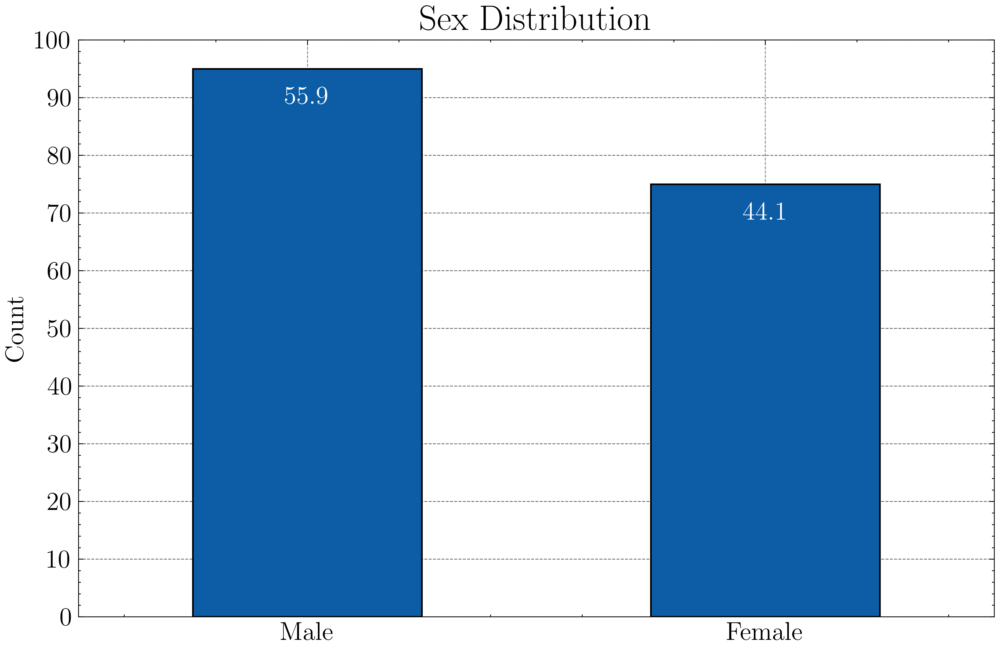

Sex counts:
Sex
M    95
F    75
Name: count, dtype: int64

Sex proportions:
Sex
M    0.558824
F    0.441176
Name: count, dtype: float64


In [45]:
# =============================================================================
# Calculate Sex Distribution and Plot Bar Chart
# =============================================================================

# Compute the counts of each sex (ignoring missing values)
sex_counts = clinical_data['Sex'].value_counts(dropna=True)

# Calculate the proportion of each sex based on the total number of patients
sex_proportions = sex_counts / len(clinical_data)

# Create a bar chart for sex distribution
fig, ax = plt.subplots(figsize=(9, 6))
sex_counts.plot(kind='bar', ax=ax, edgecolor='black')

# Customize the plot appearance
ax.tick_params(axis='x', rotation=0)
ax.set_title('Sex Distribution')
ax.set_xlabel('')  # Remove x-axis label for better readability
ax.set_ylabel('Count')
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Set custom x-axis tick labels (assumes the order corresponds to ['Male', 'Female'])
ax.set_xticklabels(['Male', 'Female'])

# Add percentage labels on top of each bar
for i, count in enumerate(sex_counts):
    percentage = sex_proportions[i] * 100
    # Position the text slightly below the top of each bar for better readability
    ax.text(i, count - 7, f'{percentage:.1f}%', ha='center', va='bottom', color='white')

# Set y-axis ticks from 0 to 100 at intervals of 10
plt.yticks(np.arange(0, 110, 10))

# Adjust layout and save the plot to a PDF file
plt.tight_layout()
output_path = 'Bilder/sex_distribution_after_filtering_FUP.pdf'
fig.savefig(output_path, format='pdf')

# Display the plot
plt.show()

# Print the computed sex counts and proportions for reference
print("Sex counts:")
print(sex_counts)
print("\nSex proportions:")
print(sex_proportions)


Number of patients with age information: 170
Average age: 55.61 years (95% CI: 53.75 - 57.48)
Median age: 57.00 years (Range: 8.00 - 85.00)


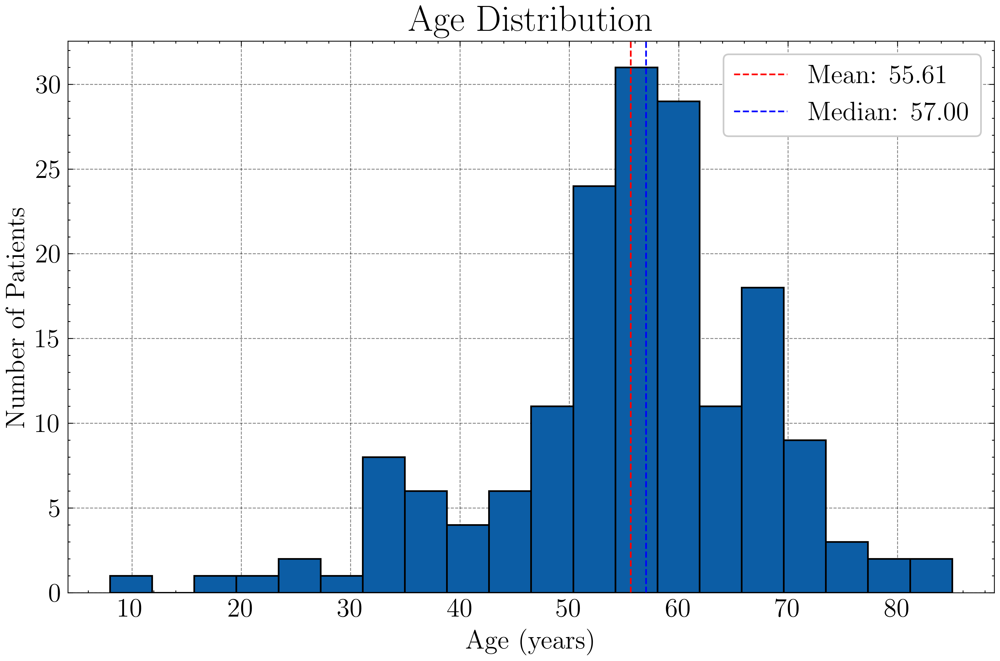

In [46]:
# =============================================================================
# Age Statistics: Calculation and Visualization
# =============================================================================

# ---- Calculate Descriptive Statistics for Age ----
# Compute the average and median age of the patients
average_age = clinical_data['AgeAtStudyDate'].mean()
median_age = clinical_data['AgeAtStudyDate'].median()
print(f"Number of patients with age information: {clinical_data['AgeAtStudyDate'].notna().sum()}")
# Determine the minimum and maximum ages for a range reference
min_age = clinical_data['AgeAtStudyDate'].min()
max_age = clinical_data['AgeAtStudyDate'].max()

# Calculate the sample size (number of patients with valid age data)
n = clinical_data['AgeAtStudyDate'].notna().sum()

# Compute the standard error of the mean age
std_err = clinical_data['AgeAtStudyDate'].std() / np.sqrt(n)

# Calculate the 95% confidence interval for the average age using the t-distribution
confidence_interval = stats.t.interval(0.95, df=n-1, loc=average_age, scale=std_err)

# Display the computed statistics with uncertainty and range
print(f"Average age: {average_age:.2f} years (95% CI: {confidence_interval[0]:.2f} - {confidence_interval[1]:.2f})")
print(f"Median age: {median_age:.2f} years (Range: {min_age:.2f} - {max_age:.2f})")


# ---- Plot the Age Distribution ----
plt.figure(figsize=(10, 6))
# Plot a histogram for age, excluding any missing values
plt.hist(clinical_data['AgeAtStudyDate'].dropna(), bins=20, edgecolor='black')

# Mark the average and median on the histogram with dashed vertical lines
plt.axvline(average_age, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {average_age:.2f}')
plt.axvline(median_age, color='blue', linestyle='dashed', linewidth=1, label=f'Median: {median_age:.2f}')

# Set plot title and axis labels
plt.title('Age Distribution')
plt.xlabel('Age (years)')
plt.ylabel('Number of Patients')

# Add a legend to differentiate between mean and median lines
plt.legend()

# Save the plot to a PDF file for record-keeping
output_path = 'Bilder/age_distribution_dataset_after_filtering_FUP.pdf'
plt.savefig(output_path, format='pdf')

# Display the plot
plt.show()

### Survival analysis for patients with known death date

Missing values before cleaning:
SurvivalTime      94
event_observed     0
dtype: int64

Missing values after removing NaN:
SurvivalTime      0
event_observed    0
dtype: int64
Patients with known survival time (event observed): 76

After removing infinite values:
SurvivalTime      0
event_observed    0
dtype: int64
Infinite values in 'SurvivalTime': 0

Data is cleaned and ready for analysis.

IDH1/2 counts:
IDH1/2
negative    41
NaN         28
positive     7
Name: count, dtype: int64

MGMT counts:
MGMT
NaN         35
negative    26
positive    15
Name: count, dtype: int64

Survival statistics by IDH1/2 status:
                mean  median  count
IDH1/2                             
NaN       594.928571   480.5     28
negative  597.853659   500.0     41
positive  773.285714   541.0      7

Survival statistics by MGMT status:
                mean  median  count
MGMT                               
NaN       546.885714   483.0     35
negative  628.038462   501.5     26
positive  740.866667 

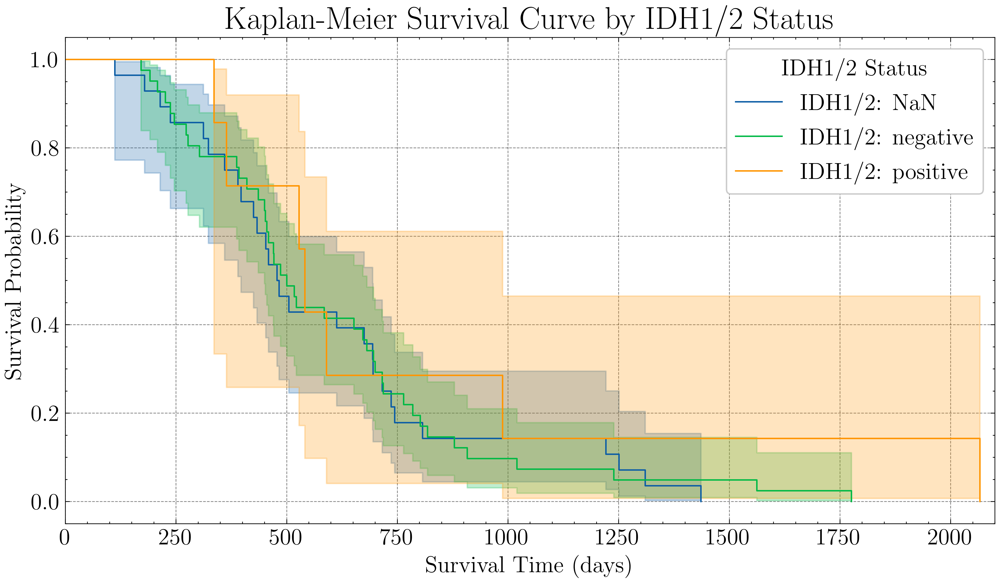

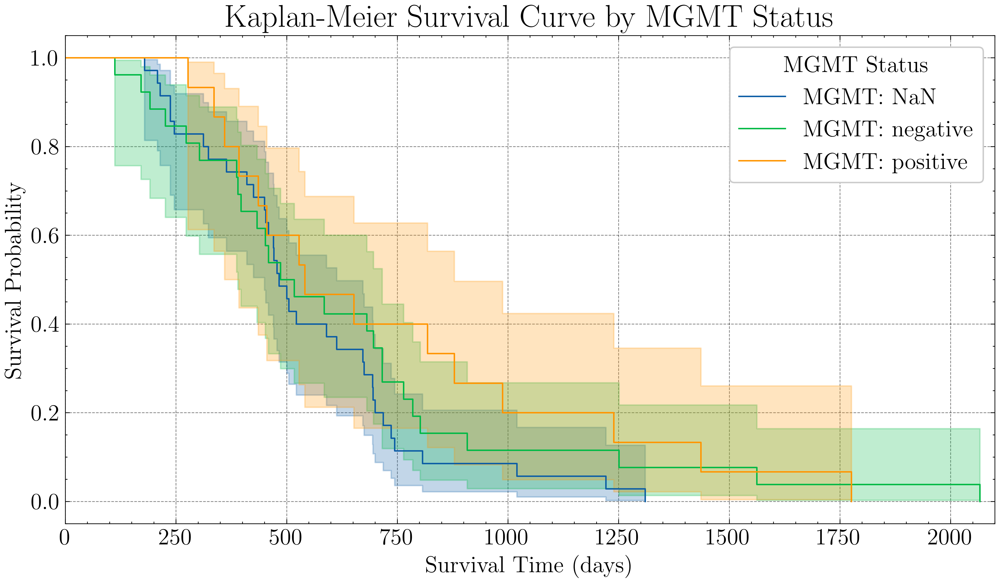


Overall survival statistics for patients with known death dates:
Median Survival Time: 502.50 days (95% CI: 455.99 - 632.50 days)
Mean Survival Time: 612.93 days (95% CI: 528.92 - 696.95 days)

Survival statistics per MGMT status:
MGMT: NaN
  Median Survival: 483.00 days (95% CI: 429.13 - 611.31 days)
  Mean Survival: 546.89 days (95% CI: 458.78 - 634.99 days)
MGMT: negative
  Median Survival: 486.00 days (95% CI: 388.23 - 702.21 days)
  Mean Survival: 628.04 days (95% CI: 458.52 - 797.56 days)
MGMT: positive
  Median Survival: 541.00 days (95% CI: 360.05 - 875.70 days)
  Mean Survival: 740.87 days (95% CI: 514.44 - 967.29 days)

Survival statistics per IDH1/2 status:
IDH1/2: NaN
  Median Survival: 478.00 days (95% CI: 391.78 - 690.55 days)
  Mean Survival: 594.93 days (95% CI: 466.08 - 723.78 days)
IDH1/2: negative
  Median Survival: 500.00 days (95% CI: 445.83 - 675.59 days)
  Mean Survival: 597.85 days (95% CI: 491.99 - 703.72 days)
IDH1/2: positive
  Median Survival: 541.00 days (

In [47]:
# =============================================================================
# 1. Data Preparation and Date Conversion
# =============================================================================

# Create a copy of the clinical data for cleaning and analysis
clinical_data_clean = clinical_data.copy()

# Define follow-up columns (if needed for further analysis)
follow_up_columns = [
    'Anonym1st_fup', 'Anonym2nd_fup', 'Anonym3rd_fup', 'Anonym4th_fup', 
    'Anonym5th_fup', 'Anonym6th_fup', 'Anonym7th_fup', 'Anonym8th_fup', 
    'Anonym9th_fup', 'Anonym10th_fup'
]

# List of date columns to convert to datetime format
date_columns = ['AnonymStudyDate', 'AnonymDeath', 'AnonymEnd of RT']

# Convert specified columns to datetime, coercing errors (e.g., wrong format) to NaT
for col in date_columns:
    clinical_data_clean[col] = pd.to_datetime(
        clinical_data_clean[col],
        format='%m/%d/%y',  # Adjust format as necessary for your dataset
        errors='coerce'
    )

# =============================================================================
# 2. Survival Time Calculation and Data Integrity Checks
# =============================================================================

# Calculate survival time in days: difference between death and study start dates
clinical_data_clean['SurvivalTime'] = (
    clinical_data_clean['AnonymDeath'] - clinical_data_clean['AnonymStudyDate']
).dt.days

# Check for required columns in the dataset
required_columns = ['IDH1/2', 'MGMT', 'SurvivalTime']
missing_columns = [col for col in required_columns if col not in clinical_data_clean.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the dataset: {missing_columns}")

# Ensure the 'event_observed' column exists; if not, assume all events are observed (1)
if 'event_observed' not in clinical_data_clean.columns:
    clinical_data_clean['event_observed'] = 1  # Adjust as needed

# Display missing values for key columns before cleaning
print("Missing values before cleaning:")
print(clinical_data_clean[['SurvivalTime', 'event_observed']].isnull().sum())

# Convert 'SurvivalTime' and 'event_observed' to numeric values
clinical_data_clean['SurvivalTime'] = pd.to_numeric(clinical_data_clean['SurvivalTime'], errors='coerce')
clinical_data_clean['event_observed'] = pd.to_numeric(clinical_data_clean['event_observed'], errors='coerce')

# Remove rows with NaN values in either 'SurvivalTime' or 'event_observed'
clinical_data_clean = clinical_data_clean.dropna(subset=['SurvivalTime', 'event_observed'])
print("\nMissing values after removing NaN:")
print(clinical_data_clean[['SurvivalTime', 'event_observed']].isnull().sum())
print(f"Patients with known survival time (event observed): {clinical_data_clean.shape[0]}")

# Remove any rows with infinite values in 'SurvivalTime'
clinical_data_clean = clinical_data_clean[~np.isinf(clinical_data_clean['SurvivalTime'])]
print("\nAfter removing infinite values:")
print(clinical_data_clean[['SurvivalTime', 'event_observed']].isnull().sum())
print("Infinite values in 'SurvivalTime':", np.isinf(clinical_data_clean['SurvivalTime']).sum())

# Assertions to ensure no NaN or infinite values remain in key columns
assert clinical_data_clean['SurvivalTime'].isnull().sum() == 0, "There are still NaN values in 'SurvivalTime'"
assert clinical_data_clean['event_observed'].isnull().sum() == 0, "There are still NaN values in 'event_observed'"
assert not np.isinf(clinical_data_clean['SurvivalTime']).any(), "Infinite values exist in 'SurvivalTime'"

print("\nData is cleaned and ready for analysis.")

# =============================================================================
# 3. Data Filtering and Group Counts
# =============================================================================

# Convert rows with MGMT equal to '?' into NaN so they are included as missing values
clinical_data_clean['MGMT'] = clinical_data_clean['MGMT'].replace('?', np.nan)

# Count and display values for 'IDH1/2' and 'MGMT'
idh_counts = clinical_data_clean['IDH1/2'].fillna('NaN').value_counts(dropna=False)
mgmt_counts = clinical_data_clean['MGMT'].fillna('NaN').value_counts(dropna=False)
print("\nIDH1/2 counts:")
print(idh_counts)
print("\nMGMT counts:")
print(mgmt_counts)

# Calculate survival statistics (mean, median, count) per group for both markers
idh_groups = clinical_data_clean.groupby(clinical_data_clean['IDH1/2'].fillna('NaN'))['SurvivalTime'].agg(['mean', 'median', 'count'])
mgmt_groups = clinical_data_clean.groupby(clinical_data_clean['MGMT'].fillna('NaN'))['SurvivalTime'].agg(['mean', 'median', 'count'])
print("\nSurvival statistics by IDH1/2 status:")
print(idh_groups)
print("\nSurvival statistics by MGMT status:")
print(mgmt_groups)

# =============================================================================
# 4. Kaplan-Meier Survival Analysis Functions
# =============================================================================

def get_median_confidence_interval(kmf):
    """
    Compute the median survival confidence interval from a fitted KaplanMeierFitter instance.
    Returns a tuple (lower_median, upper_median). If computation fails, returns (NaN, NaN).
    """
    median = kmf.median_survival_time_
    if np.isnan(median):
        return (np.nan, np.nan)
    
    ci = kmf.confidence_interval_
    # Identify the lower and upper bound columns in the confidence interval DataFrame
    lower_cols = [col for col in ci.columns if 'lower' in col.lower()]
    upper_cols = [col for col in ci.columns if 'upper' in col.lower()]
    
    if not lower_cols or not upper_cols:
        print("Confidence interval columns not found.")
        return (np.nan, np.nan)
    
    lower_col = lower_cols[0]
    upper_col = upper_cols[0]
    
    # Extract the lower and upper confidence series
    ci_lower = ci[lower_col]
    ci_upper = ci[upper_col]
    
    # Use interpolation to estimate the time when survival probability reaches 0.5
    try:
        f_lower = interp1d(ci_lower.index.values, ci_lower.values, kind='linear', bounds_error=False, fill_value="extrapolate")
        time_points = np.linspace(ci_lower.index.min(), ci_lower.index.max(), num=1000)
        lower_surv = f_lower(time_points)
        lower_surv = np.nan_to_num(lower_surv, nan=1.0)
        lower_median = np.interp(0.5, lower_surv[::-1], time_points[::-1])
    except Exception as e:
        print(f"Error calculating lower confidence interval: {e}")
        lower_median = np.nan
    
    try:
        f_upper = interp1d(ci_upper.index.values, ci_upper.values, kind='linear', bounds_error=False, fill_value="extrapolate")
        upper_surv = f_upper(time_points)
        upper_surv = np.nan_to_num(upper_surv, nan=0.0)
        upper_median = np.interp(0.5, upper_surv[::-1], time_points[::-1])
    except Exception as e:
        print(f"Error calculating upper confidence interval: {e}")
        upper_median = np.nan

    return (lower_median, upper_median)

def perform_kmf_analysis(data, group_col, label_prefix):
    """
    Perform Kaplan-Meier survival analysis for groups defined in 'group_col'.
    Plots survival curves, saves the figure, and returns dictionaries of median survival
    times and their confidence intervals per group.
    """
    kmf = KaplanMeierFitter()
    plt.figure(figsize=(10, 6))
    
    median_survival_times = {}
    median_conf_intervals = {}
    
    # Group data by the specified column, filling missing values as 'NaN'
    for status, group in data.groupby(data[group_col].fillna('NaN')):
        try:
            kmf.fit(
                durations=group['SurvivalTime'], 
                event_observed=group['event_observed'], 
                label=f'{label_prefix}: {status}'
            )
            kmf.plot_survival_function(ci_show=True)
            
            # Save the median survival time and confidence interval for the current group
            median_survival_times[status] = kmf.median_survival_time_
            lower_median, upper_median = get_median_confidence_interval(kmf)
            median_conf_intervals[status] = (lower_median, upper_median)
        except Exception as e:
            print(f"Error in group {group_col}: {status} -> {e}")
    
    plt.title(f"Kaplan-Meier Survival Curve by {group_col} Status")
    plt.xlim(0, 2100)
    plt.xlabel("Survival Time (days)")
    plt.ylabel("Survival Probability")
    plt.legend(title=f'{group_col} Status')
    plt.tight_layout()
    output_path = f'Bilder/kaplan_meier_survival_curve_{group_col[:3]}.pdf'
    plt.savefig(output_path, format='pdf')
    plt.show()
    
    return median_survival_times, median_conf_intervals

# =============================================================================
# 5. Kaplan-Meier Survival Analysis for IDH1/2 and MGMT Groups
# =============================================================================

# Kaplan-Meier analysis for IDH1/2 status
idh_median_survival_times, idh_median_conf_intervals = perform_kmf_analysis(
    data=clinical_data_clean,
    group_col='IDH1/2',
    label_prefix='IDH1/2'
)

# Kaplan-Meier analysis for MGMT status
mgmt_median_survival_times, mgmt_median_conf_intervals = perform_kmf_analysis(
    data=clinical_data_clean,
    group_col='MGMT',
    label_prefix='MGMT'
)

# =============================================================================
# 6. Overall Survival Statistics and Confidence Intervals
# =============================================================================

# Compute overall median and mean survival times
overall_median = clinical_data_clean['SurvivalTime'].median()
overall_mean = clinical_data_clean['SurvivalTime'].mean()

def bootstrap_ci(data, func, n_bootstrap=1000, ci=95):
    """
    Bootstrap function to compute the confidence interval for a statistic.
    'func' is the function to compute the statistic (e.g., np.median).
    """
    bootstrapped = [func(np.random.choice(data, size=len(data), replace=True)) for _ in range(n_bootstrap)]
    lower = np.percentile(bootstrapped, (100 - ci) / 2)
    upper = np.percentile(bootstrapped, 100 - (100 - ci) / 2)
    return lower, upper

# Bootstrap 95% CI for the median survival time
overall_median_ci = bootstrap_ci(clinical_data_clean['SurvivalTime'], np.median)

def compute_mean_ci(data):
    """
    Compute the 95% confidence interval for the mean survival time using the standard error.
    """
    mean_val = np.mean(data)
    se = np.std(data, ddof=1) / np.sqrt(len(data))
    return mean_val, mean_val - 1.96 * se, mean_val + 1.96 * se

overall_mean_val, overall_mean_lower, overall_mean_upper = compute_mean_ci(clinical_data_clean['SurvivalTime'])
overall_mean_ci = (overall_mean_lower, overall_mean_upper)

print("\nOverall survival statistics for patients with known death dates:")
print(f"Median Survival Time: {overall_median:.2f} days (95% CI: {overall_median_ci[0]:.2f} - {overall_median_ci[1]:.2f} days)")
print(f"Mean Survival Time: {overall_mean:.2f} days (95% CI: {overall_mean_ci[0]:.2f} - {overall_mean_ci[1]:.2f} days)")

# =============================================================================
# 7. Group-wise Survival Statistics (MGMT and IDH1/2)
# =============================================================================

# MGMT Groups: Calculate and print group-wise mean and median survival statistics with 95% CIs
print("\nSurvival statistics per MGMT status:")
mgmt_groups = clinical_data_clean.groupby(clinical_data_clean['MGMT'].fillna('NaN'))['SurvivalTime']
for status, group in mgmt_groups:
    mean_val, mean_lower, mean_upper = compute_mean_ci(group)
    median_val = mgmt_median_survival_times.get(status, np.nan)
    ci_lower, ci_upper = mgmt_median_conf_intervals.get(status, (np.nan, np.nan))
    print(f"MGMT: {status}")
    print(f"  Median Survival: {median_val:.2f} days (95% CI: {ci_lower:.2f} - {ci_upper:.2f} days)")
    print(f"  Mean Survival: {mean_val:.2f} days (95% CI: {mean_lower:.2f} - {mean_upper:.2f} days)")

# IDH1/2 Groups: Calculate and print group-wise survival statistics with 95% CIs
print("\nSurvival statistics per IDH1/2 status:")
idh_groups = clinical_data_clean.groupby(clinical_data_clean['IDH1/2'].fillna('NaN'))['SurvivalTime']
for status, group in idh_groups:
    mean_val, mean_lower, mean_upper = compute_mean_ci(group)
    median_val = idh_median_survival_times.get(status, np.nan)
    ci_lower, ci_upper = idh_median_conf_intervals.get(status, (np.nan, np.nan))
    print(f"IDH1/2: {status}")
    print(f"  Median Survival: {median_val:.2f} days (95% CI: {ci_lower:.2f} - {ci_upper:.2f} days)")
    print(f"  Mean Survival: {mean_val:.2f} days (95% CI: {mean_lower:.2f} - {mean_upper:.2f} days)")

# =============================================================================
# 8. Range of Median Survival Times Across Groups
# =============================================================================

# Calculate and print the range of median survival times for MGMT groups
if mgmt_median_survival_times:
    mgmt_median_values = list(mgmt_median_survival_times.values())
    min_median_mgmt = min(mgmt_median_values)
    max_median_mgmt = max(mgmt_median_values)
    print(f"\nRange of median survival times across MGMT status groups:")
    print(f"Min median survival: {min_median_mgmt:.2f} days")
    print(f"Max median survival: {max_median_mgmt:.2f} days")
else:
    print("\nNo MGMT groups to calculate range of median survival.")

# Calculate and print the range of median survival times for IDH1/2 groups
if idh_median_survival_times:
    idh_median_values = list(idh_median_survival_times.values())
    min_median_idh = min(idh_median_values)
    max_median_idh = max(idh_median_values)
    print(f"\nRange of median survival times across IDH1/2 status groups:")
    print(f"Min median survival: {min_median_idh:.2f} days")
    print(f"Max median survival: {max_median_idh:.2f} days")
else:
    print("\nNo IDH1/2 groups to calculate range of median survival.")


Number of patients with known death date: 76


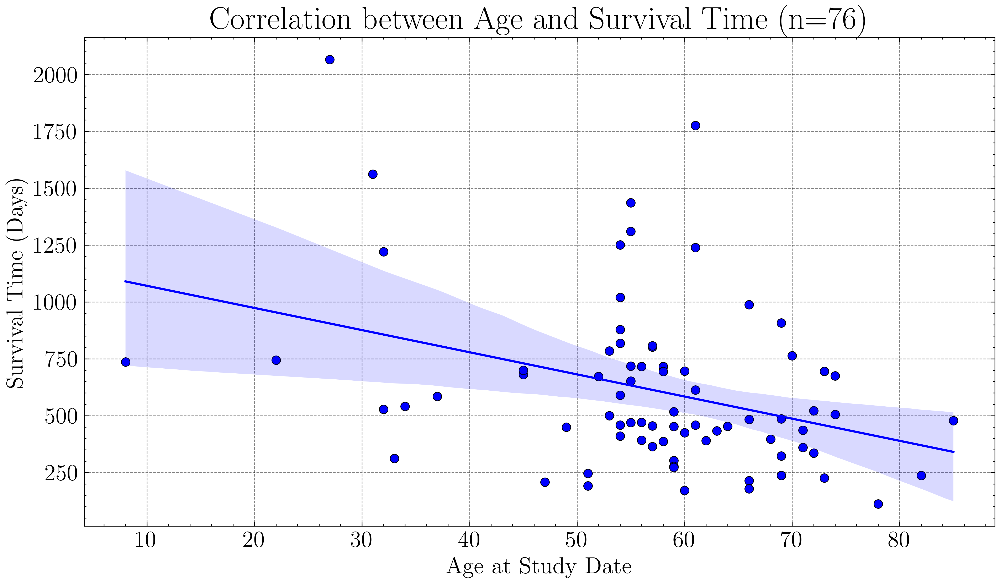

Pearson correlation between age and survival time: -0.35
P-value: 1.73e-03
(r = -0.35, 95\% CI: [-0.54, -0.14], p = 0.002)


In [48]:
# =============================================================================
# Exclude Patients Without a Valid Death Date and Convert Survival Time
# =============================================================================
clinical_data_clean = clinical_data_clean[clinical_data['AnonymDeath'].notna()]
# Filter out patients with missing DeathDate (i.e., only include those with known death dates)

# Count the number of patients with a known death date for reporting
num_known_death = len(clinical_data_clean)
print(f"Number of patients with known death date: {num_known_death}")
# Convert SurvivalTime from days to months for visualization (if needed)
# Using an average month length of 30.44 days
clinical_data_clean['SurvivalTime_Months'] = clinical_data_clean['SurvivalTime'] / 30.44

# =============================================================================
# Scatter Plot: Age vs. Survival Time with Regression Line
# =============================================================================
plt.figure(figsize=(10, 6))

# Create a scatter plot for Age at Study Date vs. Survival Time (in days)
sns.scatterplot(x='AgeAtStudyDate', y='SurvivalTime', data=clinical_data_clean, 
                color='blue', edgecolor='black')

# =============================================================================
# Pearson Correlation Calculation and Confidence Interval
# =============================================================================
# Calculate the Pearson correlation coefficient and p-value between age and survival time
correlation, p_value = pearsonr(clinical_data_clean['AgeAtStudyDate'], clinical_data_clean['SurvivalTime'])
# Re-assert that only patients with a known death date (event_observed == 1) are included
# Compute the 95% confidence interval for the correlation using Fisher's z-transformation
n = len(clinical_data_clean)
z = np.arctanh(correlation) 
se = 1 / np.sqrt(n - 3)    
z_conf_lower = z - 1.96 * se
z_conf_upper = z + 1.96 * se
r_conf_lower = np.tanh(z_conf_lower) 
r_conf_upper = np.tanh(z_conf_upper)

# Plot the regression line with a 95% confidence interval using Seaborn's regplot
sns.regplot(x='AgeAtStudyDate', y='SurvivalTime', data=clinical_data_clean, 
            scatter=False, ci=95, color='blue')

# Set plot title with the sample size, correlation coefficient, and its 95% confidence interval
plt.title(f'Correlation between Age and Survival Time (n={num_known_death})')
plt.xlabel('Age at Study Date')
plt.ylabel('Survival Time (Days)')
plt.grid(True)
plt.tight_layout()

# Save the plot as a PDF file
plt.savefig('Bilder/correlation_age_ST_plot.pdf', format='pdf')
plt.show()

print(f"Pearson correlation between age and survival time: {correlation:.2f}")
print(f"P-value: {p_value:.2e}")
print(f'(r = {correlation:.2f}, 95\% CI: [{r_conf_lower:.2f}, {r_conf_upper:.2f}], p = {p_value:.3f})')

## Survival analysis including censored patients 

Data is cleaned and ready for analysis.

IDH1/2 counts:
IDH1/2
negative    97
NaN         60
positive    13
Name: count, dtype: int64

MGMT counts:
MGMT
NaN         81
negative    54
positive    35
Name: count, dtype: int64

Survival statistics by IDH1/2 status:
                mean  median  count
IDH1/2                             
NaN       472.816667   368.0     60
negative  420.525773   306.0     97
positive  556.153846   364.0     13

Survival statistics by MGMT status:
                mean  median  count
MGMT                               
NaN       420.234568   361.0     81
negative  433.537037   304.5     54
positive  541.142857   436.0     35


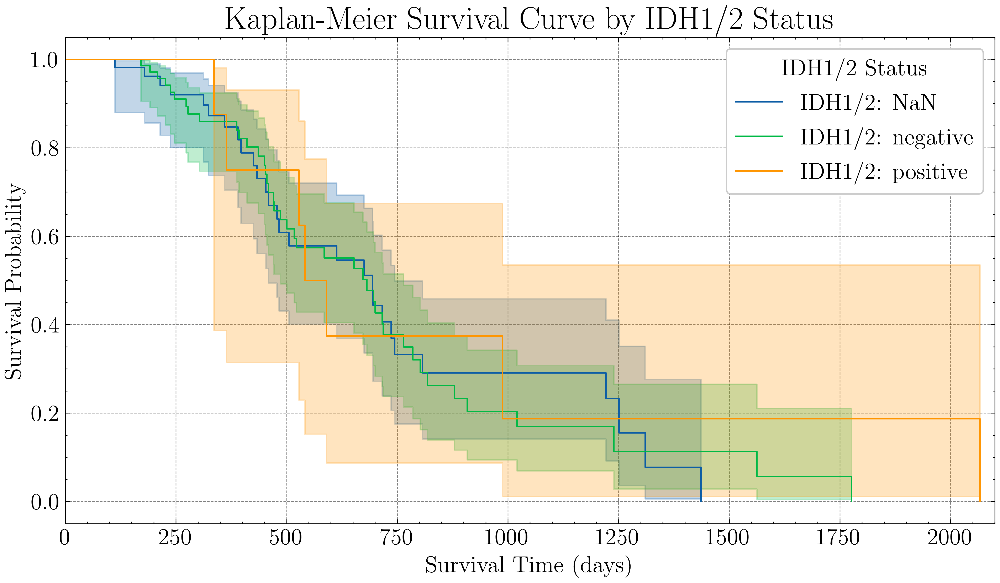

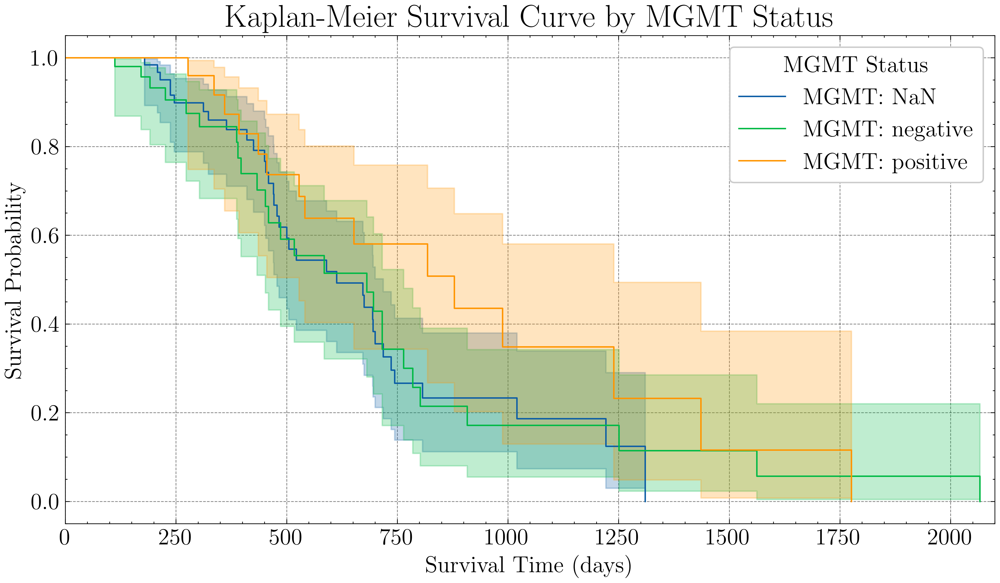


Overall survival statistics for patients (using last follow-up for censored patients):
Median Survival Time: 360.50 days (95% CI: 303.50 - 426.50 days)
Mean Survival Time: 449.35 days (95% CI: 396.70 - 502.01 days)

Survival statistics per MGMT status:
MGMT: NaN
  Median Survival: 613.00 days (95% CI: 473.98 - 702.12 days)
  Mean Survival: 420.23 days (95% CI: 355.56 - 484.91 days)
MGMT: negative
  Median Survival: 681.00 days (95% CI: 437.76 - 742.01 days)
  Mean Survival: 433.54 days (95% CI: 331.85 - 535.23 days)
MGMT: positive
  Median Survival: 879.00 days (95% CI: 514.33 - 1230.45 days)
  Mean Survival: 541.14 days (95% CI: 406.74 - 675.54 days)

Survival statistics per IDH1/2 status:
IDH1/2: NaN
  Median Survival: 694.00 days (95% CI: 457.93 - 744.02 days)
  Mean Survival: 472.82 days (95% CI: 388.45 - 557.18 days)
IDH1/2: negative
  Median Survival: 681.00 days (95% CI: 480.90 - 760.72 days)
  Mean Survival: 420.53 days (95% CI: 354.50 - 486.55 days)
IDH1/2: positive
  Median 

In [49]:
# =============================================================================
# 1. Data Preparation and Date Conversion
# =============================================================================

# Create a copy of the clinical data for cleaning and analysis
clinical_data_clean = clinical_data.copy()

# List of date columns (including LastValidFollowUp) to be converted to datetime format
date_columns = ['AnonymStudyDate', 'AnonymDeath', 'AnonymEnd of RT', 'LastValidFollowUp']

# Convert the specified columns to datetime, coercing errors to NaT
for col in date_columns:
    clinical_data_clean[col] = pd.to_datetime(
        clinical_data_clean[col],
        format='%m/%d/%y',  # Adjust the format as needed
        errors='coerce'
    )

# =============================================================================
# 2. Survival Time Calculation and Data Integrity Checks
# =============================================================================

# Calculate SurvivalTime (in days):
# - If a death date is available, use the difference between death and study start.
# - Otherwise, use the difference between last valid follow-up and study start.
clinical_data_clean['SurvivalTime'] = clinical_data_clean.apply(
    lambda row: (row['AnonymDeath'] - row['AnonymStudyDate']).days 
                if pd.notna(row['AnonymDeath'])
                else (row['LastValidFollowUp'] - row['AnonymStudyDate']).days,
    axis=1
)

# Set 'event_observed': 1 if death date exists; 0 if censored (last follow-up)
clinical_data_clean['event_observed'] = clinical_data_clean['AnonymDeath'].notnull().astype(int)

# Ensure required columns are present in the dataset
required_columns = ['IDH1/2', 'MGMT', 'SurvivalTime']
missing_columns = [col for col in required_columns if col not in clinical_data_clean.columns]
if missing_columns:
    raise ValueError(f"The following required columns are missing from the dataset: {missing_columns}")

# Convert 'SurvivalTime' and 'event_observed' to numeric values
clinical_data_clean['SurvivalTime'] = pd.to_numeric(clinical_data_clean['SurvivalTime'], errors='coerce')
clinical_data_clean['event_observed'] = pd.to_numeric(clinical_data_clean['event_observed'], errors='coerce')

# Remove rows with NaN in either 'SurvivalTime' or 'event_observed'
clinical_data_clean = clinical_data_clean.dropna(subset=['SurvivalTime', 'event_observed'])

# Remove any rows with infinite values in 'SurvivalTime'
clinical_data_clean = clinical_data_clean[~np.isinf(clinical_data_clean['SurvivalTime'])]

# Confirm that the data is clean using assertions
assert clinical_data_clean['SurvivalTime'].isnull().sum() == 0, "There are still NaN in 'SurvivalTime'"
assert clinical_data_clean['event_observed'].isnull().sum() == 0, "There are still NaN in 'event_observed'"
assert not np.isinf(clinical_data_clean['SurvivalTime']).any(), "There are infinite values in 'SurvivalTime'"

print("Data is cleaned and ready for analysis.")

# =============================================================================
# 3. Data Filtering and Group Counts
# =============================================================================

# Convert rows with MGMT equal to '?' into NaN to include them as missing values
clinical_data_clean['MGMT'] = clinical_data_clean['MGMT'].replace('?', np.nan)

# Count and display values for 'IDH1/2' and 'MGMT'
idh_counts = clinical_data_clean['IDH1/2'].fillna('NaN').value_counts(dropna=False)
mgmt_counts = clinical_data_clean['MGMT'].fillna('NaN').value_counts(dropna=False)
print("\nIDH1/2 counts:")
print(idh_counts)
print("\nMGMT counts:")
print(mgmt_counts)

# Calculate survival statistics (mean, median, count) per group for both markers
idh_groups = clinical_data_clean.groupby(clinical_data_clean['IDH1/2'].fillna('NaN'))['SurvivalTime'].agg(['mean', 'median', 'count'])
mgmt_groups = clinical_data_clean.groupby(clinical_data_clean['MGMT'].fillna('NaN'))['SurvivalTime'].agg(['mean', 'median', 'count'])
print("\nSurvival statistics by IDH1/2 status:")
print(idh_groups)
print("\nSurvival statistics by MGMT status:")
print(mgmt_groups)

# =============================================================================
# 4. Kaplan-Meier Survival Analysis Functions
# =============================================================================

def get_median_confidence_interval(kmf):
    """
    Compute the median survival confidence interval from a fitted KaplanMeierFitter instance.
    Returns a tuple (lower_median, upper_median). If computation fails, returns (NaN, NaN).
    """
    median = kmf.median_survival_time_
    if np.isnan(median):
        return (np.nan, np.nan)
    
    ci = kmf.confidence_interval_
    # Identify the lower and upper bound columns from the confidence interval DataFrame
    lower_cols = [col for col in ci.columns if 'lower' in col.lower()]
    upper_cols = [col for col in ci.columns if 'upper' in col.lower()]
    
    if not lower_cols or not upper_cols:
        print("Confidence interval columns not found.")
        return (np.nan, np.nan)
    
    lower_col = lower_cols[0]
    upper_col = upper_cols[0]
    
    ci_lower = ci[lower_col]
    ci_upper = ci[upper_col]
    
    # Interpolate to estimate the time when the survival probability reaches 0.5
    try:
        f_lower = interp1d(ci_lower.index.values, ci_lower.values, kind='linear', bounds_error=False, fill_value="extrapolate")
        time_points = np.linspace(ci_lower.index.min(), ci_lower.index.max(), num=1000)
        lower_surv = f_lower(time_points)
        lower_surv = np.nan_to_num(lower_surv, nan=1.0)
        lower_median = np.interp(0.5, lower_surv[::-1], time_points[::-1])
    except Exception as e:
        print(f"Error calculating lower confidence interval: {e}")
        lower_median = np.nan
    
    try:
        f_upper = interp1d(ci_upper.index.values, ci_upper.values, kind='linear', bounds_error=False, fill_value="extrapolate")
        upper_surv = f_upper(time_points)
        upper_surv = np.nan_to_num(upper_surv, nan=0.0)
        upper_median = np.interp(0.5, upper_surv[::-1], time_points[::-1])
    except Exception as e:
        print(f"Error calculating upper confidence interval: {e}")
        upper_median = np.nan

    return (lower_median, upper_median)

def perform_kmf_analysis(data, group_col, label_prefix):
    """
    Perform Kaplan-Meier survival analysis for groups defined by 'group_col'.
    The function plots survival curves, saves the figure, and returns dictionaries of
    median survival times and their confidence intervals per group.
    """
    kmf = KaplanMeierFitter()
    plt.figure(figsize=(10, 6))
    
    median_survival_times = {}
    median_conf_intervals = {}
    
    # Group data by the specified column (filling missing values as 'NaN')
    for status, group in data.groupby(data[group_col].fillna('NaN')):
        try:
            kmf.fit(
                durations=group['SurvivalTime'], 
                event_observed=group['event_observed'], 
                label=f'{label_prefix}: {status}'
            )
            kmf.plot_survival_function(ci_show=True)
            
            # Save the median survival time and its confidence interval for this group
            median_survival_times[status] = kmf.median_survival_time_
            lower_median, upper_median = get_median_confidence_interval(kmf)
            median_conf_intervals[status] = (lower_median, upper_median)
        except Exception as e:
            print(f"Error in group {group_col}: {status} -> {e}")
    
    plt.title(f"Kaplan-Meier Survival Curve by {group_col} Status")
    plt.xlim(0, 2100)
    plt.xlabel("Survival Time (days)")
    plt.ylabel("Survival Probability")
    plt.legend(title=f'{group_col} Status')
    plt.tight_layout()
    output_path = f'Bilder/kaplan_meier_survival_curve_{group_col[:3]}.pdf'
    plt.savefig(output_path, format='pdf')
    plt.show()
    
    return median_survival_times, median_conf_intervals

# =============================================================================
# 5. Kaplan-Meier Survival Analysis for IDH1/2 and MGMT Groups
# =============================================================================

# Kaplan-Meier analysis by IDH1/2 status
idh_median_survival_times, idh_median_conf_intervals = perform_kmf_analysis(
    data=clinical_data_clean,
    group_col='IDH1/2',
    label_prefix='IDH1/2'
)

# Kaplan-Meier analysis by MGMT status
mgmt_median_survival_times, mgmt_median_conf_intervals = perform_kmf_analysis(
    data=clinical_data_clean,
    group_col='MGMT',
    label_prefix='MGMT'
)

# =============================================================================
# 6. Overall Survival Statistics and Confidence Intervals
# =============================================================================

# Compute overall median and mean survival times
overall_median = clinical_data_clean['SurvivalTime'].median()
overall_mean = clinical_data_clean['SurvivalTime'].mean()

def bootstrap_ci(data, func, n_bootstrap=1000, ci=95):
    """
    Compute the confidence interval for a statistic via bootstrapping.
    'func' is the statistic function (e.g., np.median).
    """
    bootstrapped = [func(np.random.choice(data, size=len(data), replace=True)) for _ in range(n_bootstrap)]
    lower = np.percentile(bootstrapped, (100 - ci) / 2)
    upper = np.percentile(bootstrapped, 100 - (100 - ci) / 2)
    return lower, upper

# Bootstrap 95% CI for the median survival time
overall_median_ci = bootstrap_ci(clinical_data_clean['SurvivalTime'], np.median)

def compute_mean_ci(data):
    """
    Compute the 95% confidence interval for the mean survival time using standard error.
    """
    mean_val = np.mean(data)
    se = np.std(data, ddof=1) / np.sqrt(len(data))
    return mean_val, mean_val - 1.96 * se, mean_val + 1.96 * se

overall_mean_val, overall_mean_lower, overall_mean_upper = compute_mean_ci(clinical_data_clean['SurvivalTime'])
overall_mean_ci = (overall_mean_lower, overall_mean_upper)

print("\nOverall survival statistics for patients (using last follow-up for censored patients):")
print(f"Median Survival Time: {overall_median:.2f} days (95% CI: {overall_median_ci[0]:.2f} - {overall_median_ci[1]:.2f} days)")
print(f"Mean Survival Time: {overall_mean:.2f} days (95% CI: {overall_mean_ci[0]:.2f} - {overall_mean_ci[1]:.2f} days)")

# =============================================================================
# 7. Group-wise Survival Statistics (MGMT and IDH1/2)
# =============================================================================

# MGMT groups: Calculate and print group-wise survival statistics with 95% confidence intervals
print("\nSurvival statistics per MGMT status:")
mgmt_groups = clinical_data_clean.groupby(clinical_data_clean['MGMT'].fillna('NaN'))['SurvivalTime']
for status, group in mgmt_groups:
    mean_val, mean_lower, mean_upper = compute_mean_ci(group)
    median_val = mgmt_median_survival_times.get(status, np.nan)
    ci_lower, ci_upper = mgmt_median_conf_intervals.get(status, (np.nan, np.nan))
    print(f"MGMT: {status}")
    print(f"  Median Survival: {median_val:.2f} days (95% CI: {ci_lower:.2f} - {ci_upper:.2f} days)")
    print(f"  Mean Survival: {mean_val:.2f} days (95% CI: {mean_lower:.2f} - {mean_upper:.2f} days)")

# IDH1/2 groups: Calculate and print group-wise survival statistics with 95% confidence intervals
print("\nSurvival statistics per IDH1/2 status:")
idh_groups = clinical_data_clean.groupby(clinical_data_clean['IDH1/2'].fillna('NaN'))['SurvivalTime']
for status, group in idh_groups:
    mean_val, mean_lower, mean_upper = compute_mean_ci(group)
    median_val = idh_median_survival_times.get(status, np.nan)
    ci_lower, ci_upper = idh_median_conf_intervals.get(status, (np.nan, np.nan))
    print(f"IDH1/2: {status}")
    print(f"  Median Survival: {median_val:.2f} days (95% CI: {ci_lower:.2f} - {ci_upper:.2f} days)")
    print(f"  Mean Survival: {mean_val:.2f} days (95% CI: {mean_lower:.2f} - {mean_upper:.2f} days)")

# =============================================================================
# 8. Range of Median Survival Times Across Groups
# =============================================================================

# Calculate the range of median survival times for MGMT groups
if mgmt_median_survival_times:
    mgmt_median_values = list(mgmt_median_survival_times.values())
    min_median_mgmt = min(mgmt_median_values)
    max_median_mgmt = max(mgmt_median_values)
    print(f"\nRange of median survival times across MGMT status groups:")
    print(f"Min median survival: {min_median_mgmt:.2f} days")
    print(f"Max median survival: {max_median_mgmt:.2f} days")
else:
    print("\nNo MGMT groups to calculate range of median survival.")

# Calculate the range of median survival times for IDH1/2 groups
if idh_median_survival_times:
    idh_median_values = list(idh_median_survival_times.values())
    min_median_idh = min(idh_median_values)
    max_median_idh = max(idh_median_values)
    print(f"\nRange of median survival times across IDH1/2 status groups:")
    print(f"Min median survival: {min_median_idh:.2f} days")
    print(f"Max median survival: {max_median_idh:.2f} days")
else:
    print("\nNo IDH1/2 groups to calculate range of median survival.")


In [50]:
from lifelines import KaplanMeierFitter

# Filter kun pasienter med observert hendelse (død)
observed_events_only = clinical_data_clean[clinical_data_clean['event_observed'] == 1]

# Kaplan-Meier på bare disse pasientene
kmf_observed = KaplanMeierFitter()
kmf_observed.fit(durations=observed_events_only['SurvivalTime'],
                 event_observed=observed_events_only['event_observed'])

# Tidspunktene for evaluering
time_points = [365, 730, 1095, 1825]  # 1, 2, 3, 5 år

print("\nKaplan-Meier Survival Probabilities with 95% Confidence Intervals (known death only):")
ci_df = kmf_observed.confidence_interval_

for t in time_points:
    survival_prob = kmf_observed.predict(t)

    if t in ci_df.index:
        ci_row = ci_df.loc[t]
    else:
        valid_times = ci_df.index[ci_df.index <= t]
        if len(valid_times) == 0:
            ci_row = ci_df.iloc[0]
        else:
            closest_time = valid_times.max()
            ci_row = ci_df.loc[closest_time]

    lower_bound = ci_row.iloc[0]
    upper_bound = ci_row.iloc[1]

    if t == 365:
        time_label = "1-year"
    elif t == 730:
        time_label = "2-year"
    elif t == 1095:
        time_label = "3-year"
    elif t == 1825:
        time_label = "5-year"

    print(f"  {time_label} survival: {survival_prob:.2f} (95% CI: {lower_bound:.2f} - {upper_bound:.2f})")



Kaplan-Meier Survival Probabilities with 95% Confidence Intervals (known death only):
  1-year survival: 0.76 (95% CI: 0.65 - 0.84)
  2-year survival: 0.25 (95% CI: 0.16 - 0.35)
  3-year survival: 0.11 (95% CI: 0.05 - 0.19)
  5-year survival: 0.01 (95% CI: 0.00 - 0.06)


In [51]:
kmf = KaplanMeierFitter()
kmf.fit(durations=clinical_data_clean['SurvivalTime'],
        event_observed=clinical_data_clean['event_observed'])

# Define the time points for evaluation
time_points = [365, 730, 1095, 1825]  # corresponding to 1, 2, 3, and 5 years

print("\nKaplan-Meier Survival Probabilities with 95% Confidence Intervals (complete dataset):")
ci_df = kmf.confidence_interval_  # DataFrame with the confidence intervals

for t in time_points:
    survival_prob = kmf.predict(t)
    
    # If the exact time point is not in the confidence_interval_ index,
    # find the largest time that is less than or equal to t.
    if t in ci_df.index:
        ci_row = ci_df.loc[t]
    else:
        # Get all time points available in the confidence_interval_ that are <= t
        valid_times = ci_df.index[ci_df.index <= t]
        if len(valid_times) == 0:
            # Fallback to the first available time if none are less than t
            ci_row = ci_df.iloc[0]
        else:
            closest_time = valid_times.max()
            ci_row = ci_df.loc[closest_time]
    
    # Assuming the first column is the lower bound and the second is the upper bound
    lower_bound = ci_row.iloc[0]
    upper_bound = ci_row.iloc[1]
    
    # Format the time label for clarity
    if t == 365:
        time_label = "1-year"
    elif t == 730:
        time_label = "2-year"
    elif t == 1095:
        time_label = "3-year"
    elif t == 1825:
        time_label = "5-year"
    
    print(f"  {time_label} survival: {survival_prob:.2f} (95% CI: {lower_bound:.2f} - {upper_bound:.2f})")


Kaplan-Meier Survival Probabilities with 95% Confidence Intervals (complete dataset):
  1-year survival: 0.85 (95% CI: 0.76 - 0.90)
  2-year survival: 0.39 (95% CI: 0.29 - 0.49)
  3-year survival: 0.22 (95% CI: 0.13 - 0.32)
  5-year survival: 0.03 (95% CI: 0.00 - 0.12)


In [52]:
# Calculate the minimum, maximum, and median survival data per MGMT status
mgmt_survival_stats = clinical_data_clean.groupby(clinical_data_clean['MGMT'].fillna('NaN'))['SurvivalTime'].agg(['min', 'max', 'median'])

print("\nSurvival statistics per MGMT status:")
print(mgmt_survival_stats)


Survival statistics per MGMT status:
          min   max  median
MGMT                       
NaN        59  1310   361.0
negative   63  2066   304.5
positive   73  1776   436.0


95% CI: [-0.25, 0.20]
p = 8.40e-01


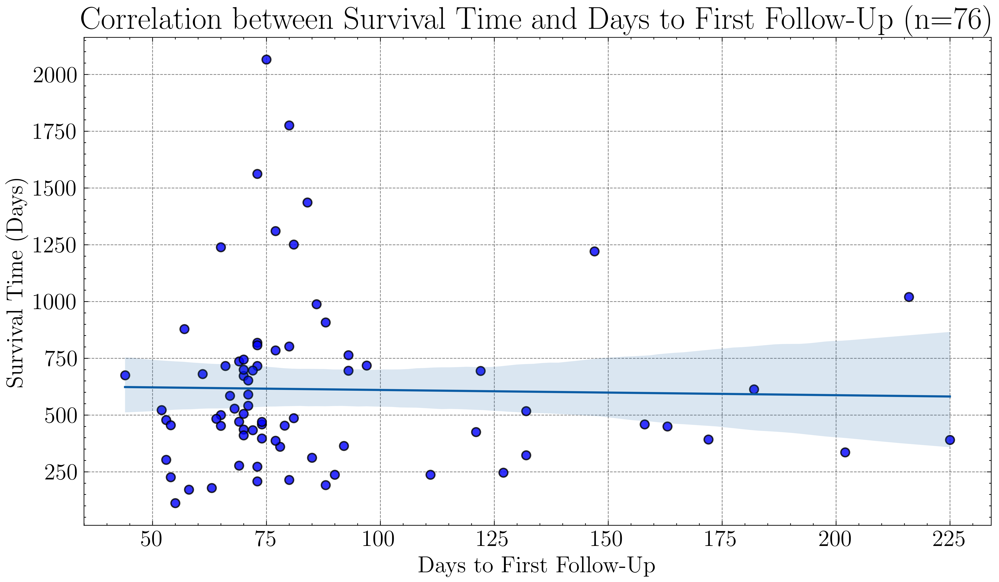

(r = -0.02, 95\% CI: [-0.25, 0.20], p = 0.840)


In [53]:
# =============================================================================
# Data Cleaning and Correlation Analysis
# =============================================================================

# Filter out rows:
# - Include only rows where a death date is available (ensuring survival time is based on death)
# - Drop rows with NaN in either 'SurvivalTime' or 'DaysToFirstValidFollowUp'
clinical_data_clean = clinical_data_clean[clinical_data_clean['AnonymDeath'].notnull()]
clinical_data_clean = clinical_data_clean.dropna(subset=['SurvivalTime', 'DaysToFirstValidFollowUp'])

# =============================================================================
# Pearson Correlation Calculation
# =============================================================================

# Calculate Pearson correlation coefficient and corresponding p-value between
# DaysToFirstValidFollowUp and SurvivalTime
corr_coef, p_value = pearsonr(clinical_data_clean['DaysToFirstValidFollowUp'], 
                                clinical_data_clean['SurvivalTime'])

# =============================================================================
# Confidence Interval for Correlation using Fisher Transformation
# =============================================================================

# Determine sample size
n = clinical_data_clean.shape[0]

# Compute standard error for Fisher's z-transform: se = 1/sqrt(n - 3)
se = 1 / np.sqrt(n - 3)

# Apply Fisher transformation (arctanh) to the correlation coefficient
z = np.arctanh(corr_coef)

# Compute the lower and upper z values for a 95% confidence interval
z_lower = z - 1.96 * se
z_upper = z + 1.96 * se

# Transform the z values back to the correlation scale using tanh
lower_r = np.tanh(z_lower)
upper_r = np.tanh(z_upper)

# Print the 95% confidence interval and the p-value
print(f"95% CI: [{lower_r:.2f}, {upper_r:.2f}]")
print(f"p = {p_value:.2e}")

# =============================================================================
# Scatter Plot with Regression Line and 95% Confidence Interval
# =============================================================================

plt.figure(figsize=(10, 6))
sns.regplot(x='DaysToFirstValidFollowUp', y='SurvivalTime', data=clinical_data_clean,
            scatter_kws={'color': 'blue', 'edgecolor': 'black'}, ci=95)

# Add a title that includes the correlation coefficient, its 95% CI, and p-value
plt.title(f'Correlation between Survival Time and Days to First Follow-Up (n={n})')
plt.xlabel('Days to First Follow-Up')
plt.ylabel('Survival Time (Days)')
plt.grid(True)
plt.tight_layout()
# Save the plot as a PDF file
plt.savefig('Bilder/correlation_ST_FUP_plot.pdf', format='pdf')
plt.show()
print(f'(r = {corr_coef:.2f}, 95\% CI: [{lower_r:.2f}, {upper_r:.2f}], p = {p_value:.3f})')

Number of patients with known death date: 76


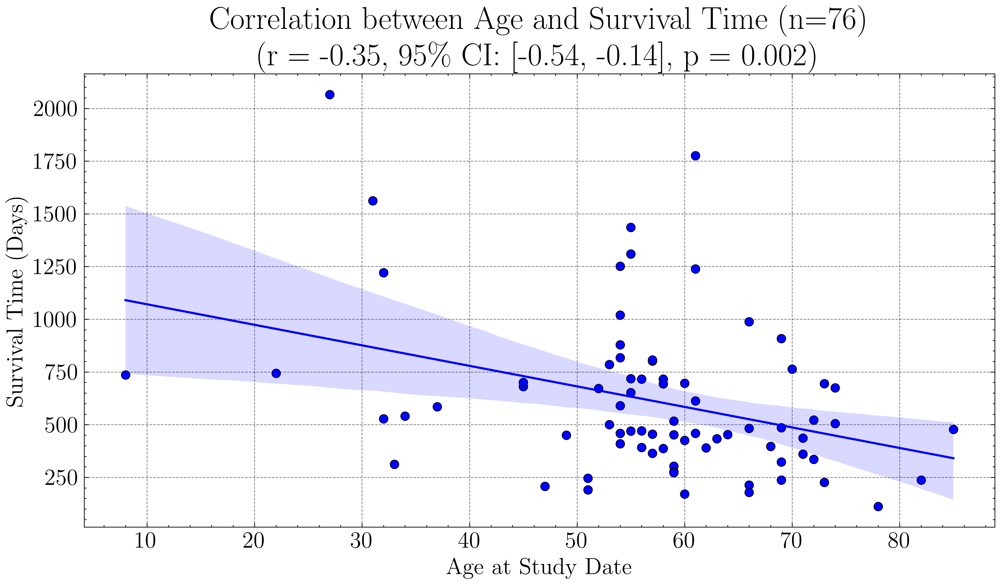

Pearson correlation between age and survival time: -0.35
P-value: 1.73e-03


In [54]:
# =============================================================================
# Exclude Patients Without a Valid Death Date and Convert Survival Time
# =============================================================================
clinical_data_clean = clinical_data_clean[clinical_data_clean['event_observed'] == 1]
# Filter out patients with missing DeathDate (i.e., only include those with known death dates)

# Count the number of patients with a known death date for reporting
num_known_death = len(clinical_data_clean)
print(f"Number of patients with known death date: {num_known_death}")
# Convert SurvivalTime from days to months for visualization (if needed)
# Using an average month length of 30.44 days
clinical_data_clean['SurvivalTime_Months'] = clinical_data_clean['SurvivalTime'] / 30.44

# =============================================================================
# Scatter Plot: Age vs. Survival Time with Regression Line
# =============================================================================
plt.figure(figsize=(10, 6))

# Create a scatter plot for Age at Study Date vs. Survival Time (in days)
sns.scatterplot(x='AgeAtStudyDate', y='SurvivalTime', data=clinical_data_clean, 
                color='blue', edgecolor='black')

# =============================================================================
# Pearson Correlation Calculation and Confidence Interval
# =============================================================================
# Calculate the Pearson correlation coefficient and p-value between age and survival time
correlation, p_value = pearsonr(clinical_data_clean['AgeAtStudyDate'], clinical_data_clean['SurvivalTime'])
# Re-assert that only patients with a known death date (event_observed == 1) are included
# Compute the 95% confidence interval for the correlation using Fisher's z-transformation
n = len(clinical_data_clean)
z = np.arctanh(correlation) 
se = 1 / np.sqrt(n - 3)    
z_conf_lower = z - 1.96 * se
z_conf_upper = z + 1.96 * se
r_conf_lower = np.tanh(z_conf_lower) 
r_conf_upper = np.tanh(z_conf_upper)

# Plot the regression line with a 95% confidence interval using Seaborn's regplot
sns.regplot(x='AgeAtStudyDate', y='SurvivalTime', data=clinical_data_clean, 
            scatter=False, ci=95, color='blue')

# Set plot title with the sample size, correlation coefficient, and its 95% confidence interval
plt.title(f'Correlation between Age and Survival Time (n={num_known_death})\n'
          f'(r = {correlation:.2f}, 95\% CI: [{r_conf_lower:.2f}, {r_conf_upper:.2f}], p = {p_value:.3f})')
plt.xlabel('Age at Study Date')
plt.ylabel('Survival Time (Days)')
plt.grid(True)
plt.tight_layout()

# Save the plot as a PDF file
plt.savefig('Bilder/correlation_age_ST_plot.pdf', format='pdf')
plt.show()

print(f"Pearson correlation between age and survival time: {correlation:.2f}")
print(f"P-value: {p_value:.2e}")

In [55]:
clinical_data['AnonymStudyDate'] = pd.to_datetime(clinical_data['AnonymStudyDate'], errors='coerce', format='%m/%d/%y')
clinical_data['AnonymDeath'] = pd.to_datetime(clinical_data['AnonymDeath'], errors='coerce', format='%m/%d/%y')
# 1. Calculate the average number of follow-ups per patient
clinical_data['num_followups'] = clinical_data[follow_up_columns].notna().sum(axis=1)
average_followups = clinical_data['num_followups'].mean()

# 2. Count the number of progression occurrences
progression_columns =  [col for col in clinical_data.columns if 'Response_' in col]
clinical_data['progression_count'] = clinical_data[progression_columns].apply(lambda row: (row == 'progression').sum(), axis=1)
total_progression_cases = clinical_data['progression_count'].sum()

# Display the results
print(f"Average number of follow-ups per patient: {average_followups}")
print(f"Total number of progression cases: {total_progression_cases}")

num_known_death = clinical_data['AnonymDeath'].notna().sum()
print(f"Number of known deaths: {num_known_death}")
print(f"Number of unknown deaths: {len(clinical_data) - num_known_death}")

Average number of follow-ups per patient: 3.723529411764706
Total number of progression cases: 154
Number of known deaths: 76
Number of unknown deaths: 94


In [56]:

# Convert key date columns to datetime objects, coercing any errors to NaT.
clinical_data['AnonymStudyDate'] = pd.to_datetime(
    clinical_data['AnonymStudyDate'], errors='coerce', format='%m/%d/%y'
)
clinical_data['AnonymDeath'] = pd.to_datetime(
    clinical_data['AnonymDeath'], errors='coerce', format='%m/%d/%y'
)
clinical_data['AnonymEnd of RT'] = pd.to_datetime(
    clinical_data['AnonymEnd of RT'], errors='coerce', format='%m/%d/%y'
)
clinical_data['LastValidFollowUp'] = pd.to_datetime(
    clinical_data['LastValidFollowUp'], errors='coerce', format='%m/%d/%y'
)

# Create a new column 'combined_survival' that calculates survival time (in days)
# - If 'AnonymDeath' is available, use it.
# - Otherwise, use 'LastValidFollowUp'.
clinical_data['combined_survival'] = clinical_data.apply(
    lambda row: (row['AnonymDeath'] - row['AnonymStudyDate']).days 
                if pd.notna(row['AnonymDeath'])
                else (row['LastValidFollowUp'] - row['AnonymStudyDate']).days,
    axis=1
)
clinical_data['event_observed'] = clinical_data['AnonymDeath'].notna().astype(int)

# Display the first few rows to verify the results
print(clinical_data[['AnonymPatientID', 'AnonymDeath', 'AnonymEnd of RT', 
                       'LastValidFollowUp', 'combined_survival']].head())

    AnonymPatientID AnonymDeath AnonymEnd of RT LastValidFollowUp  \
0  Burdenko-GBM-001         NaT      2004-06-27        2005-03-30   
1  Burdenko-GBM-002  2005-08-11      2005-02-25        2005-06-17   
2  Burdenko-GBM-003  2005-12-05      2004-10-28        2004-11-26   
3  Burdenko-GBM-004  2006-12-02      2004-10-28        2005-03-23   
4  Burdenko-GBM-005         NaT      2004-10-28        2004-11-18   

   combined_survival  
0                328  
1                336  
2                453  
3                818  
4                 68  


In [57]:
# Convert the columns to datetime format
date_columns = ['FirstValidFollowUp', 'AnonymEnd of RT', 'AnonymStart of RT', 'AnonymStudyDate']
for col in date_columns:
    clinical_data[col] = pd.to_datetime(clinical_data[col], errors='coerce')

# Check for NaT values after conversion
if clinical_data[date_columns].isnull().any().any():
    print("Warning: Some date values could not be converted and have been set to NaT.")

# Calculate time from the end of RT to the first follow-up
clinical_data['DaysFromEndRTToFirstFollowUp'] = (
    clinical_data['FirstValidFollowUp'] - clinical_data['AnonymEnd of RT']
).dt.days

# Calculate time from the study date to the start of RT
clinical_data['DaysFromStudyDateToStartRT'] = (
    clinical_data['AnonymStart of RT'] - clinical_data['AnonymStudyDate']
).dt.days

# Handle any negative or NaN values if necessary
clinical_data['DaysFromEndRTToFirstFollowUp'] = clinical_data['DaysFromEndRTToFirstFollowUp'].apply(
    lambda x: x if x >= 0 else None
)
clinical_data['DaysFromStudyDateToStartRT'] = clinical_data['DaysFromStudyDateToStartRT'].apply(
    lambda x: x if x >= 0 else None
)

# Find the average time for both calculations, excluding NaN
average_days_from_end_rt_to_first_follow_up = clinical_data['DaysFromEndRTToFirstFollowUp'].mean()
average_days_from_study_date_to_start_rt = clinical_data['DaysFromStudyDateToStartRT'].mean()

# Display the results
print(f"Average time from the end of RT to the first follow-up: {average_days_from_end_rt_to_first_follow_up:.2f} days")
print(f"Average time from the study date to the start of RT: {average_days_from_study_date_to_start_rt:.2f} days")

Average time from the end of RT to the first follow-up: 29.59 days
Average time from the study date to the start of RT: 10.23 days


### Split patients into two groups based on survival time

In [58]:
# Calculate the number of patients who live longer than 600 days
patients_over_600_days = clinical_data[clinical_data['combined_survival'] > 600].shape[0]
print(f"Number of patients who live longer than 600 days: {patients_over_600_days}")

# Calculate the median survival among patients with a known death date
median_survival_known_death = clinical_data[clinical_data['AnonymDeath'].notna()]['combined_survival'].median()
print(f"Median survival among patients with a known death date: {median_survival_known_death} days")
# Function to compute bootstrap confidence interval
def bootstrap_ci(data, func, n_bootstrap=1000, ci=95):
    bootstrapped = [func(np.random.choice(data, size=len(data), replace=True)) for _ in range(n_bootstrap)]
    lower = np.percentile(bootstrapped, (100 - ci) / 2)
    upper = np.percentile(bootstrapped, 100 - (100 - ci) / 2)
    return lower, upper

# Calculate bootstrap confidence interval for median
median_ci = bootstrap_ci(clinical_data[clinical_data['AnonymDeath'].notna()]['combined_survival'], np.median)
print(f"Median survival among patients with a known death date: {median_survival_known_death} days (95% CI: {median_ci[0]:.2f} - {median_ci[1]:.2f} days)")

# Calculate mean survival and confidence interval
mean_survival = clinical_data[clinical_data['AnonymDeath'].notna()]['combined_survival'].mean()
mean_ci = bootstrap_ci(clinical_data[clinical_data['AnonymDeath'].notna()]['combined_survival'], np.mean)
print(f"Mean survival among patients with a known death date: {mean_survival:.2f} days (95% CI: {mean_ci[0]:.2f} - {mean_ci[1]:.2f} days)") 

Number of patients who live longer than 600 days: 45
Median survival among patients with a known death date: 502.5 days
Median survival among patients with a known death date: 502.5 days (95% CI: 454.98 - 613.00 days)
Mean survival among patients with a known death date: 612.93 days (95% CI: 532.31 - 694.09 days)


In [59]:

# Filter patients with a known death date
patients_with_death = clinical_data[clinical_data['AnonymDeath'].notna()]

# Count patients with combined survival (in days) over 600 days (approx. 1.5 years)
num_survived_over_600 = clinical_data[clinical_data['combined_survival'] > 600].shape[0]

# Among patients with a known death date, count those with survival <= 600 days
num_death_under_or_equal_600 = patients_with_death[patients_with_death['combined_survival'] <= 600].shape[0]

# Display the count of patients who survived (or have a minimum survival) over 600 days
print(f"Number of patients with survival over 600 days: {num_survived_over_600}")

# Display the count of patients with a known death date who survived 600 days or less
print(f"Patients with known death date who survived 600 days or less: {num_death_under_or_equal_600}")

# Get and print the patient IDs for those with a known death date and survival <= 600 days
patient_ids_under_600 = patients_with_death[
    patients_with_death['combined_survival'] <= 600
]['AnonymPatientID'].tolist()

print("Patient IDs with known death date who survived 600 days or less:")
for patient_id in patient_ids_under_600:
    print(patient_id)


Number of patients with survival over 600 days: 45
Patients with known death date who survived 600 days or less: 45
Patient IDs with known death date who survived 600 days or less:
Burdenko-GBM-002
Burdenko-GBM-003
Burdenko-GBM-012
Burdenko-GBM-028
Burdenko-GBM-033
Burdenko-GBM-034
Burdenko-GBM-036
Burdenko-GBM-038
Burdenko-GBM-049
Burdenko-GBM-050
Burdenko-GBM-051
Burdenko-GBM-052
Burdenko-GBM-053
Burdenko-GBM-055
Burdenko-GBM-056
Burdenko-GBM-061
Burdenko-GBM-069
Burdenko-GBM-082
Burdenko-GBM-084
Burdenko-GBM-086
Burdenko-GBM-088
Burdenko-GBM-099
Burdenko-GBM-102
Burdenko-GBM-103
Burdenko-GBM-105
Burdenko-GBM-106
Burdenko-GBM-112
Burdenko-GBM-115
Burdenko-GBM-116
Burdenko-GBM-118
Burdenko-GBM-120
Burdenko-GBM-122
Burdenko-GBM-124
Burdenko-GBM-126
Burdenko-GBM-134
Burdenko-GBM-137
Burdenko-GBM-138
Burdenko-GBM-140
Burdenko-GBM-146
Burdenko-GBM-149
Burdenko-GBM-155
Burdenko-GBM-161
Burdenko-GBM-166
Burdenko-GBM-171
Burdenko-GBM-180


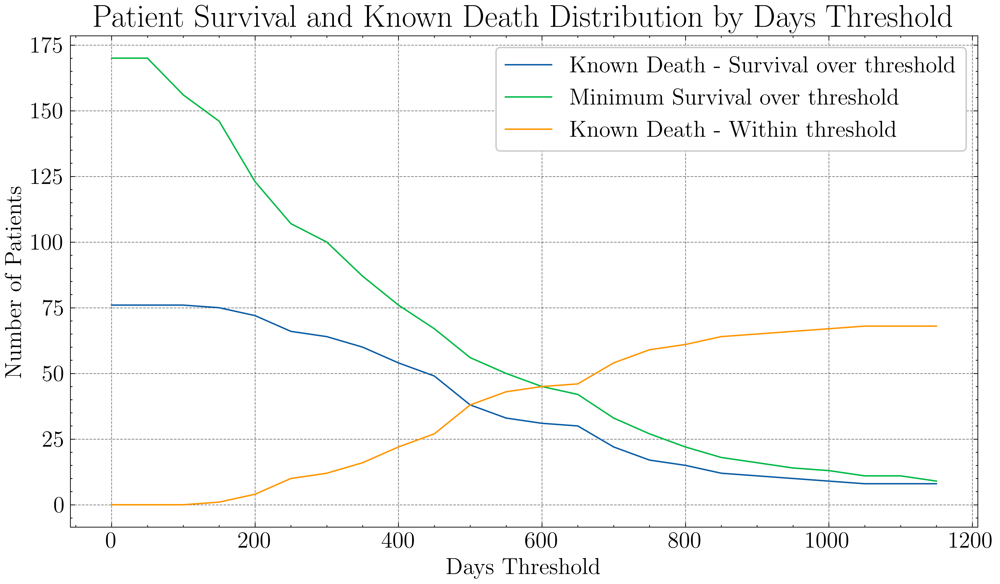

In [60]:
# Define the range of days to analyze, from 0 to 1200 days in increments of 50
days_range = range(0, 1200, 50)

# Lists to store patient counts for each threshold in days
known_death_over_threshold = []
min_survival_over_threshold = []
death_only_threshold = []

# Iterate over each day threshold to calculate counts
for days in days_range:
    # Patients with known death and survival over threshold
    known_death_over = patients_with_death[patients_with_death['combined_survival'] > days].shape[0]
    known_death_over_threshold.append(known_death_over)
    
    # Patients with minimum survival over threshold (includes unknown deaths)
    min_survival_over = clinical_data[
        (clinical_data['AnonymDeath'].notna() & (clinical_data['combined_survival'] > days)) | 
        (clinical_data['AnonymDeath'].isna() & (clinical_data['combined_survival'] > days))
    ].shape[0]
    min_survival_over_threshold.append(min_survival_over)
    
    # Patients with known death within threshold
    death_only = clinical_data[(clinical_data['AnonymDeath'].notna()) & (clinical_data['combined_survival'] <= days)].shape[0]
    death_only_threshold.append(death_only)

# Plotting the updated results with all three lines
plt.figure(figsize=(10, 6))
plt.plot(days_range, known_death_over_threshold, label='Known Death - Survival over threshold')
plt.plot(days_range, min_survival_over_threshold, label='Minimum Survival over threshold')
plt.plot(days_range, death_only_threshold, label='Known Death - Within threshold')

plt.xlabel('Days Threshold')
plt.ylabel('Number of Patients')
plt.title('Patient Survival and Known Death Distribution by Days Threshold')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('Bilder/patient_survival_death_distribution_by_threshold.pdf')
plt.show()

The plot indicates that a threshold of 600 days provides the optimal balance between classes while maximizing the dataset size.

Number of patients who died within 600 days: 45
Number of patients who survived at least 600 days: 45


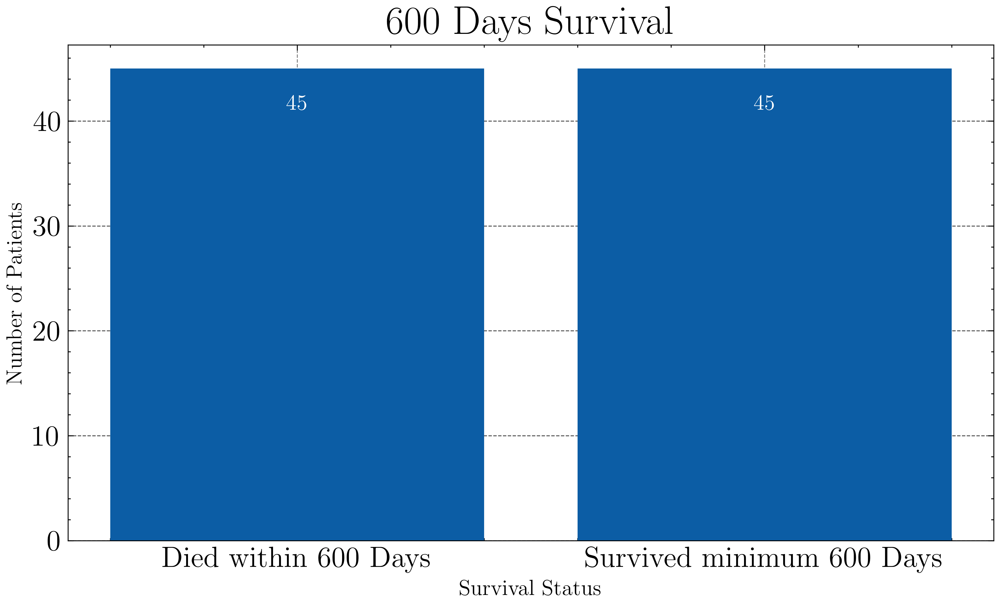

In [61]:
# Define the threshold and filter the data
threshold_days = 600

# Patients who died within 600 days
died_within_threshold = clinical_data[
    (clinical_data['AnonymDeath'].notna()) & 
    (clinical_data['combined_survival'] <= threshold_days)
]

# Patients who survived at least 600 days
survived_at_least_threshold = clinical_data[
    (clinical_data['combined_survival'] > threshold_days)
]

# Verify the groups
print(f"Number of patients who died within {threshold_days} days: {died_within_threshold.shape[0]}")
print(f"Number of patients who survived at least {threshold_days} days: {survived_at_least_threshold.shape[0]}")

# Visualization: Bar Chart
labels = ['Died within 600 Days', 'Survived minimum 600 Days']
counts = [died_within_threshold.shape[0], survived_at_least_threshold.shape[0]]

# Create the bar plot with formatting
fig, ax = plt.subplots(figsize=(8, 5))

bars = ax.bar(labels, counts)

# Adding numbers on the bars
for bar in bars:
    height = bar.get_height()
    ax.annotate(f'{height}', 
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, -25),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', va='bottom', fontsize=12, color='white')

# Adding titles and labels with adjustments
ax.set_ylabel('Number of Patients', fontsize=12)
ax.set_xlabel('Survival Status', fontsize=12)
ax.set_title(f'{threshold_days} Days Survival')

# Adding grid for readability
ax.grid(True, axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.savefig('Bilder/survival_status_bar_chart.pdf')
plt.show()

### Preparing dataset for ML, adding dose information

In [62]:
# =============================================================================
# Load and Merge Dose Data with Clinical Data
# ============================================================================
# Read dose data from a CSV file.
# This CSV is generated via preprocessing.ipynb and the doseloader in dataset_pipeline.py.
dose_data = pd.read_csv('PFS_filtered_data.csv')

def extract_numeric_id(series):
    """
    Extract the numeric identifier from a patient ID string.
    
    Assumes the format "Burdenko-GBM-<number>" and extracts the trailing digits.
    
    Parameters:
        series (pd.Series): A series containing patient ID strings.
        
    Returns:
        pd.Series: A series of integer values representing the numeric patient IDs.
    """
    extracted = series.astype(str).str.extract(r'(\d+)$')[0]
    return extracted.astype(int)

# Extract numeric patient IDs for both clinical and dose datasets.
clinical_data['AnonymPatientID'] = extract_numeric_id(clinical_data['AnonymPatientID'])
dose_data['patient_id'] = extract_numeric_id(dose_data['patient_id'])

# Merge clinical and dose data on the numeric patient ID.
merged_data = pd.merge(
    clinical_data,
    dose_data,
    left_on="AnonymPatientID",
    right_on="patient_id",
    how="inner",
    suffixes=("", "_duplicate")
)

# Drop any duplicate columns created during the merge.
duplicate_columns = [col for col in merged_data.columns if col.endswith("_duplicate")]
merged_data.drop(columns=duplicate_columns, inplace=True)

# Update the clinical_data DataFrame with the merged dataset.
clinical_data = merged_data

In [63]:
print(clinical_data.columns)

Index(['AnonymPatientID', 'AnonymStudyDate', 'Sex', 'IDH1/2', 'MGMT',
       'Response_1st_fup', 'Response_2nd_fup', 'Response_3rd_fup',
       'Response_4th_fup', 'Response_5th_fup',
       ...
       'num_fractions', 'max_dose', 'mean_dose', 'V95', 'V90', 'V50', 'V1',
       'brainstem_volume_cm3', 'brainstem_mean_dose', 'brainstem_max_dose'],
      dtype='object', length=141)


In [64]:
#plot num fractions 
num_fractions = clinical_data['num_fractions']
# Calculate the percentage of patients receiving 30 fractions
# Count the occurrences of each unique value in num_fractions
fraction_counts = num_fractions.value_counts()

# Sort the counts in descending order
fraction_counts = fraction_counts.sort_index(ascending=False)

# Print the counts for each unique value
print("Number of patients for each fraction count (in descending order):")
for fraction, count in fraction_counts.items():
    print(f"Fractions: {fraction}, Count: {count}")

Number of patients for each fraction count (in descending order):
Fractions: 33, Count: 5
Fractions: 32, Count: 1
Fractions: 31, Count: 2
Fractions: 30, Count: 129
Fractions: 29, Count: 1
Fractions: 28, Count: 3
Fractions: 26, Count: 1
Fractions: 25, Count: 4
Fractions: 23, Count: 2
Fractions: 20, Count: 1
Fractions: 18, Count: 1
Fractions: 15, Count: 12
Fractions: 10, Count: 1
Fractions: 7, Count: 2
Fractions: 5, Count: 2
Fractions: 3, Count: 1
Fractions: 2, Count: 1
Fractions: 1, Count: 1


In [65]:
print(f"Prescription Dose statistics (n={len(clinical_data)}):")
print(clinical_data['prescription_dose'])
# Count the occurrences of each unique integer value in 'prescription_dose'
integer_counts = clinical_data['prescription_dose'].dropna().astype(int).value_counts()

# Print the counts for each integer value
print("Occurrences of each integer value in 'prescription_dose':")
for value, count in integer_counts.items():
    print(f"Value: {value}, Count: {count}")

Prescription Dose statistics (n=170):
0      63.00
1      45.00
2      60.00
3      60.00
4      60.00
       ...  
165    60.00
166    61.35
167    60.00
168    60.00
169    60.00
Name: prescription_dose, Length: 170, dtype: float64
Occurrences of each integer value in 'prescription_dose':
Value: -1, Count: 86
Value: 60, Count: 42
Value: 61, Count: 24
Value: 45, Count: 4
Value: 59, Count: 3
Value: 64, Count: 2
Value: 63, Count: 1
Value: 67, Count: 1
Value: 36, Count: 1
Value: 66, Count: 1
Value: 43, Count: 1
Value: 56, Count: 1
Value: 57, Count: 1
Value: 58, Count: 1
Value: 46, Count: 1


In [66]:
# Define the survival threshold
threshold_days = 600

# Filter patients who died within 600 days
died_within_threshold = clinical_data[
    (clinical_data['AnonymDeath'].notna()) & 
    (clinical_data['combined_survival'] <= threshold_days)
]

# Filter patients who survived at least 600 days
survived_at_least_threshold = clinical_data[
    (clinical_data['combined_survival'] > threshold_days)
]

# Combine the two groups
filtered_data = pd.concat([died_within_threshold, survived_at_least_threshold], ignore_index=True)

# Create a new column indicating whether the patient survived over 600 days
filtered_data['Survived_Over_600_Days'] = filtered_data['combined_survival'] > threshold_days

# Erstatt manglende verdier i MGMT og fyll inn manglende verdier for IDH1/2 og MGMT
filtered_data['MGMT'] = filtered_data['MGMT'].replace('?', np.nan)
filtered_data = filtered_data.fillna({
    'IDH1/2': 'unknown',
    'MGMT': 'unknown'
})

filtered_data

,AnonymPatientID,AnonymStudyDate,Sex,IDH1/2,MGMT,Response_1st_fup,Response_2nd_fup,Response_3rd_fup,Response_4th_fup,Response_5th_fup,Response_6th_fup,Response_7th_fup,Response_8th_fup,Response_9th_fup,Response_10th_fup,AnonymDate of surgery,AnonymStart of RT,AnonymEnd of RT,AnonymDate of topometric MRI,Anonym1st_fup,Anonym2nd_fup,Anonym3rd_fup,Anonym4th_fup,Anonym5th_fup,Anonym6th_fup,Anonym7th_fup,Anonym8th_fup,Anonym9th_fup,Anonym10th_fup,AnonymDeath,AgeAtStudyDate,FirstValidFollowUp,LastValidFollowUp,FirstFollowUpNumber,DaysToFirstValidFollowUp,DaysFromRTToLastFollowUp,Days_between_surgery_and_RT,num_followups,progression_count,combined_survival,event_observed,DaysFromEndRTToFirstFollowUp,DaysFromStudyDateToStartRT,PFS_months,PFS_event,Unnamed: 0,Patient_ID,1_GTV=CTV_pituitary_adenoma_(T1+contr),2_CTV_gs+pa(+1.5cm),2_GTV_gs_(FLAIR),BOOST,Bones,Brain,Chiasm,Cochlea,Cochlea_L,FU_1_CE,FU_1_FLAIR,FU_2_CE,FU_2_CE1,FU_2_FLAIR,FU_2_FLAIR2,FU_3_CE,FU_3_FLAIR,FU_4_CE,FU_4_FLAIR,FU_5_CE,FU_5_FLAIR,GTV1,GTV1_FLAIR,GTV2,GTV2_FLAIR,GTV3,GTV_Boost,GTV_FLAIR,GTV_FLAIR1,GTV_FLAIR_CE,GTV_FLAIR_T1CE,GTV_Flair,GTV_Flair_1,GTV_Flair_2,GTV_Flair_3,GTV_PET,GTV_PETi,GTV_PETs,GTV_T1C,GTV_T1CE,GTV_T1C_0,GTV_T1C_RT,GTV_T1C_RT1,GTV_T1_C_RT_1,GTV_T1_c_RT_1,GTV_T1c,GTV_T1c_0,GTV_T1c_1,GTV_T1c_2,GTV_T1c_3,GTV_T1c_RT_1,GTV_new,GTVm,GTVn,GTVp,GTVt,OAR,PTV1,PTV2,PTV_2mm,PTV_BOOST,PTV_High,PTV_High_old,PTV_NEW,Skul,TUMOR,Tumor,chiasma,critical organ,tumor,tumor2-parietal,OpticNerve_Left,OpticNerve_Right,Brainstem,Body,LeftEye,RightEye,Lens_Left,Lens_Right,GTV_combined,CTV_combined,PTV_combined,patient_id,prescription_dose,num_fractions,max_dose,mean_dose,V95,V90,V50,V1,brainstem_volume_cm3,brainstem_mean_dose,brainstem_max_dose,Survived_Over_600_Days
0,2,2004-09-09,M,positive,positive,response,response,progression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004-08-14,2005-01-12,2005-02-25,9/9/04,2004-12-10,2005-03-30,2005-06-17,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2005-08-11,72.0,2005-03-30,2005-06-17,2.0,202.0,281.0,151,3,1,336,1,33,125.0,5.124836,1.0,1,2,0.0,0.0,0.0,0.0,0.0,1429.833909,0.744002,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.129765,1.190318,17.621453,4738.975382,10.878857,11.268007,1.802204,2.102430,55.229327,238.884296,0.000000,2,45.0,15,46.857006,1.658306,188.709269,253.110949,449.100596,4274.242278,34.990106,8.816372,40.612152,False
1,3,2004-09-08,M,unknown,unknown,progression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004-05-21,2004-09-17,2004-10-28,9/8/04,2004-11-26,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2005-12-05,64.0,2004-11-26,2004-11-26,1.0,79.0,79.0,119,1,1,453,1,29,9.0,2.299606,1.0,2,3,0.0,0.0,0.0,0.0,0.0,1521.717125,0.977051,0.0,0.0,88.986779,227.834127,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,96.498144,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,63.614864,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,1.183297,1.611725,20.259015,5059.109927,12.686641,12.847813,0.459387,0.579128,86.937521,294.181638,333.839170,3,60.0,30,65.167854,2.666567,168.607798,324.695592,571.541696,5015.480905,20.259015,23.251030,60.335571,False
2,12,2004-10-07,F,unknown,negative,progression,stable,progression,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2004-09-10,2004-10-13,2004-11-21,10/7/04,2004-12-18,2005-02-19,2005-05-01,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2005-12-14,63.0,2004-12-18,2005-05-01,1.0,72.0,206.0,33,3,2,433,1,27,6.0,2.168200,1.0,11,12,0.0,0.0,0.0,0.0,0.0,1314.022470,0.824396,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000

In [67]:
train_data = filtered_data[~filtered_data['AnonymPatientID'].isin(test_ids)].copy()
test_data = filtered_data[filtered_data['AnonymPatientID'].isin(test_ids)].copy()

# Display descriptive statistics for prescription_dose from the training data.
print("Prescription Dose statistics (train):")
print(train_data['prescription_dose'].describe())

# Calculate the mean prescription dose from the training set, excluding missing values (-1).
mean_dose = train_data.loc[train_data['prescription_dose'] != -1, 'prescription_dose'].mean()

# Replace missing prescription_dose values (-1) in both train and test sets with the computed mean.
train_data.loc[train_data['prescription_dose'] == -1, 'prescription_dose'] = mean_dose
test_data.loc[test_data['prescription_dose'] == -1, 'prescription_dose'] = mean_dose

# Calculate the mode for num_fractions from the training set, excluding missing values (-1).
mode_fractions = train_data.loc[train_data['num_fractions'] != -1, 'num_fractions'].mode()
if not mode_fractions.empty:
    mode_val = mode_fractions[0]
    # Replace missing num_fractions values (-1) in both train and test sets with the mode.
    train_data.loc[train_data['num_fractions'] == -1, 'num_fractions'] = mode_val
    test_data.loc[test_data['num_fractions'] == -1, 'num_fractions'] = mode_val
else:
    print("Warning: No mode found for num_fractions in training data.")

# Optionally, display updated descriptive statistics after imputation.
print("\nUpdated Prescription Dose statistics (train):")
print(train_data['prescription_dose'].describe())
print("\nUpdated Number of Fractions value counts (train):")
print(train_data['num_fractions'].value_counts())


Prescription Dose statistics (train):
count    72.000000
mean     13.634722
std      25.697313
min      -1.000000
25%      -1.000000
50%      -1.000000
75%      10.125000
max      61.500000
Name: prescription_dose, dtype: float64

Updated Prescription Dose statistics (train):
count    72.000000
mean     57.538889
std       2.962590
min      43.500000
25%      57.538889
50%      57.538889
75%      57.538889
max      61.500000
Name: prescription_dose, dtype: float64

Updated Number of Fractions value counts (train):
num_fractions
30    51
15     8
25     3
33     3
28     2
31     2
2      1
5      1
1      1
Name: count, dtype: int64


90


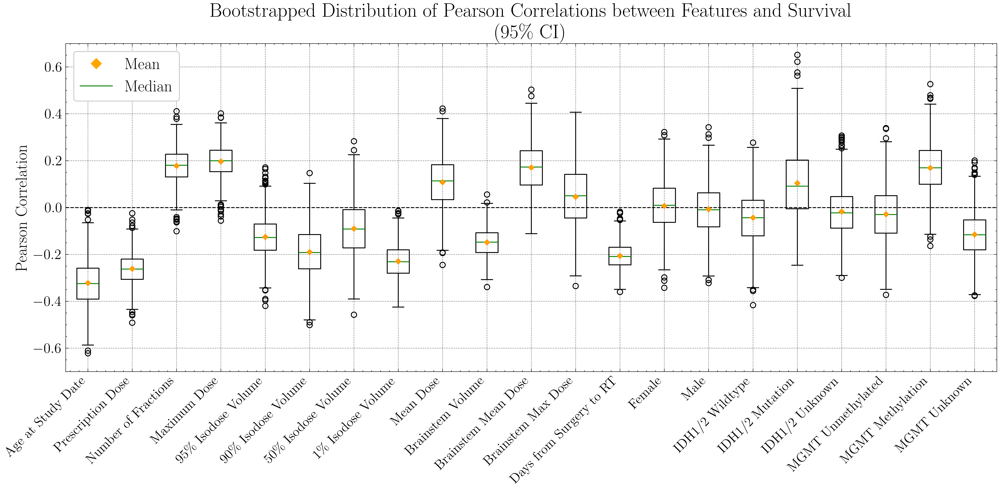

Bootstrapped correlations with Survival:
Age at Study Date              n=1000, median r=-0.324, 95% CI=(-0.499, -0.134), p-value= 0.000
Prescription Dose              n=1000, median r=-0.262, 95% CI=(-0.385, -0.138), p-value= 0.000
Number of Fractions            n=1000, median r= 0.181, 95% CI=( 0.031,  0.310), p-value= 0.022
Maximum Dose                   n=1000, median r= 0.200, 95% CI=( 0.052,  0.324), p-value= 0.012
95\% Isodose Volume            n=1000, median r=-0.128, 95% CI=(-0.298,  0.054), p-value= 0.132
90\% Isodose Volume            n=1000, median r=-0.192, 95% CI=(-0.403,  0.030), p-value= 0.088
50\% Isodose Volume            n=1000, median r=-0.092, 95% CI=(-0.314,  0.142), p-value= 0.458
1\% Isodose Volume             n=1000, median r=-0.231, 95% CI=(-0.366, -0.086), p-value= 0.000
Mean Dose                      n=1000, median r= 0.114, 95% CI=(-0.095,  0.312), p-value= 0.350
Brainstem Volume               n=1000, median r=-0.147, 95% CI=(-0.269, -0.025), p-value= 0.012

In [68]:
# -------------------------------------------
# 1) DEFINE FEATURES AND NEW OUTCOME 
# -------------------------------------------
feature_columns = [
    'AgeAtStudyDate', 'Sex', 'IDH1/2', 'MGMT',
    'prescription_dose', 'num_fractions', 'max_dose',
    'V95', 'V90', 'V50', 'V1', 'mean_dose',
    'brainstem_volume_cm3', 'brainstem_mean_dose', 'brainstem_max_dose',
    'Days_between_surgery_and_RT'
]
target_column = 'combined_survival'  # now using this as outcome
filtered_data.to_csv('filtered_data_survival.csv', index=False)
X = filtered_data[feature_columns]
y = filtered_data[target_column]
print(len(X))

# -------------------------------------------
# 2) COMBINE X + Y, AND ONE-HOT ENCODE
# -------------------------------------------
combined_df = X.copy()
combined_df[target_column] = y

categorical_features = ['Sex', 'IDH1/2', 'MGMT']
combined_encoded = pd.get_dummies(
    combined_df,
    columns=categorical_features,
    drop_first=False
)

# -------------------------------------------
# 3) BOOTSTRAPPED PAIRWISE CORRELATIONS
# -------------------------------------------
# We use bootstrapping to obtain a distribution of Pearson correlations for each feature with survival.
n_bootstraps = 1000
features_for_plot = []
boot_corrs = {}

for col in combined_encoded.columns:
    if col == target_column:
        continue

    # Remove rows with missing values for both the feature and the target
    subset = combined_encoded[[col, target_column]].dropna()
    n = subset.shape[0]

    features_for_plot.append(col)
    corrs = []
    for i in range(n_bootstraps):
        # Draw a bootstrap sample (with replacement)
        bootstrap_seed = random_seed + i
        sample = subset.sample(n, replace=True, random_state=bootstrap_seed) #to ensure reproduceability 
        # Compute the Pearson correlation for the bootstrap sample
        r = sample[col].corr(sample[target_column])
        corrs.append(r)
    boot_corrs[col] = corrs

data_to_plot = [boot_corrs[feat] for feat in features_for_plot]

# Define a mapping between internal feature names and descriptive names
real_names = {
    'AgeAtStudyDate': 'Age at Study Date',
    'Sex': 'Sex',
    'IDH1/2': 'IDH1/2 Status',
    'MGMT': 'MGMT Status',
    'prescription_dose': 'Prescription Dose',
    'num_fractions': 'Number of Fractions',
    'max_dose': 'Maximum Dose',
    'V95': '95\% Isodose Volume',
    'V90': '90\% Isodose Volume',
    'V50': '50\% Isodose Volume',
    'V1': '1\% Isodose Volume',
    'mean_dose': 'Mean Dose',
    'brainstem_volume_cm3': 'Brainstem Volume',
    'brainstem_mean_dose': 'Brainstem Mean Dose',
    'brainstem_max_dose': 'Brainstem Max Dose',
    'Days_between_surgery_and_RT': 'Days from Surgery to RT',
    'Sex_F' : 'Female',
    'Sex_M' : 'Male',
    'IDH1/2_positive' : 'IDH1/2 Mutation',
    'IDH1/2_unknown' : 'IDH1/2 Unknown',
    'IDH1/2_negative' : 'IDH1/2 Wildtype',
    'MGMT_positive' : 'MGMT Methylation',
    'MGMT_unknown' : 'MGMT Unknown',
    'MGMT_negative' : 'MGMT Unmethylated'
}

# Create the labels for the boxplot using the mapping
labels = [real_names.get(feat, feat) for feat in features_for_plot]

# Plot boksen med både mean og median styling
plt.figure(figsize=(16, 8))
plt.axhline(y=0, color='black', linewidth=1, linestyle='--')
bplot = plt.boxplot(
    data_to_plot,
    labels=labels,
    showmeans=True,
    meanprops={'marker':'D', 'markerfacecolor':'orange', 'markersize':4},
    medianprops={'color':'green', 'linewidth':1}
)
plt.xticks(rotation=45, ha='right', fontsize=15)
plt.ylim(-0.7, 0.7)
plt.ylabel("Pearson Correlation", fontsize=18)
plt.title("Bootstrapped Distribution of Pearson Correlations between Features and Survival\n(95\% CI)", fontsize=22)

# make proxy-marker for legend
mean_handle   = Line2D([], [], marker='D', color='w',
                       markerfacecolor='orange', markeredgecolor='white',
                       markersize=10, label='Mean')
median_handle = Line2D([], [], color='green', linewidth=1, label='Median')

# place legend inn upper right corner
plt.legend(handles=[mean_handle, median_handle], loc='upper left', frameon=True, fontsize=18)

plt.tight_layout()
plt.savefig('Bilder/bootstrapped_correlations_ST.pdf')
plt.show()

# -------------------------------------------
# 4) PRINT BOOTSTRAPPED CORRELATIONS, 95% CI, AND P-VALUES
# -------------------------------------------
print("Bootstrapped correlations with Survival:")
for feat in features_for_plot:
    corrs = boot_corrs[feat]
    median_val = np.median(corrs)
    ci_lower = np.percentile(corrs, 2.5)
    ci_upper = np.percentile(corrs, 97.5)
    # Compute two-tailed p-value:
    # p-value = 2 * min(proportion of bootstraps with correlation < 0, proportion > 0)
    p_val = 2 * min(np.mean(np.array(corrs) < 0), np.mean(np.array(corrs) > 0))
    descriptive_name = real_names.get(feat, feat)
    print(f"{descriptive_name:30s} n={len(corrs):4d}, median r={median_val: .3f}, 95% CI=({ci_lower: .3f}, {ci_upper: .3f}), p-value={p_val: .3f}")

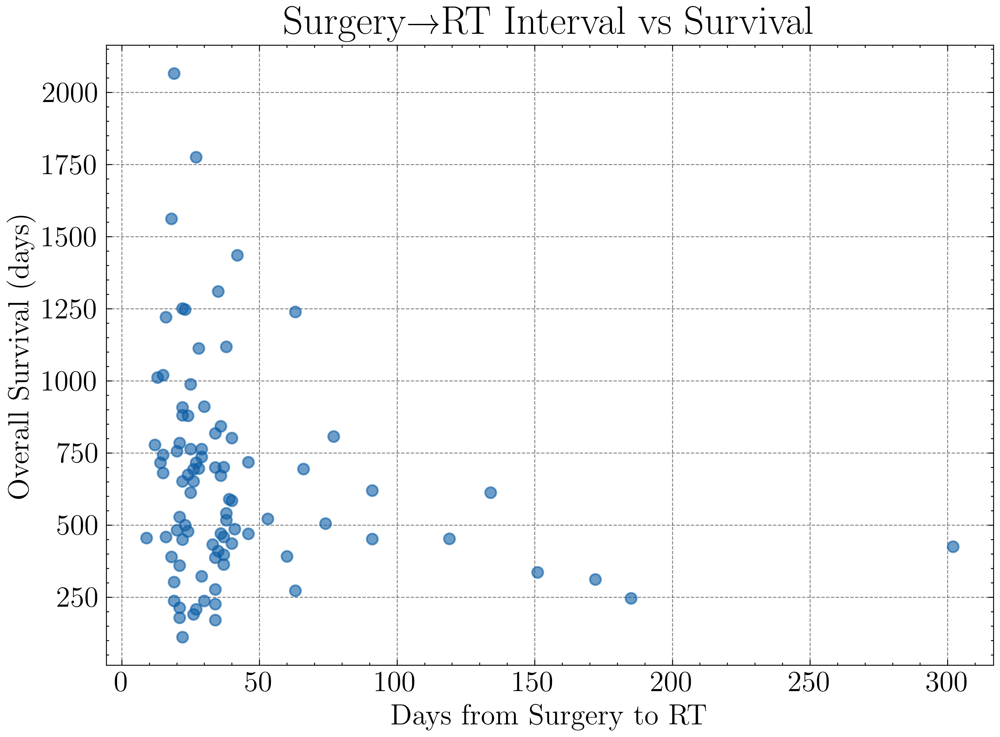

In [69]:
# 1) Scatterplot: Days_between_surgery_and_RT vs combined_survival
plt.figure(figsize=(8,6))
plt.scatter(filtered_data['Days_between_surgery_and_RT'],
            filtered_data['combined_survival'], alpha=0.6)
plt.xlabel('Days from Surgery to RT')
plt.ylabel('Overall Survival (days)')
plt.title('Surgery→RT Interval vs Survival')
plt.grid(True)
plt.tight_layout()
plt.show()

Median survival (days) by delay category (95% CI):
               median   CI 2.5%  CI 97.5%
$\leq$4 weeks   408.0  256.0000  513.0000
4–6 weeks       360.0  279.9875  434.5375
$>6$ weeks      304.0  237.0000  425.0000

Overall log-rank test:
   test_statistic         p
0        6.427335  0.040209
→ Significant at the p < 0.05 level.

Pairwise log-rank p-values:
$>6$ weeks     $\leq$4 weeks    0.016550
               4–6 weeks        0.189853
$\leq$4 weeks  4–6 weeks        0.156169
Name: p, dtype: float64

Significance (p < 0.05) for pairwise comparisons:
→ $>6$ weeks vs $\leq$4 weeks: p = 0.0166 → Significant
→ $>6$ weeks vs 4–6 weeks: p = 0.1899 → Not significant
→ $\leq$4 weeks vs 4–6 weeks: p = 0.1562 → Not significant


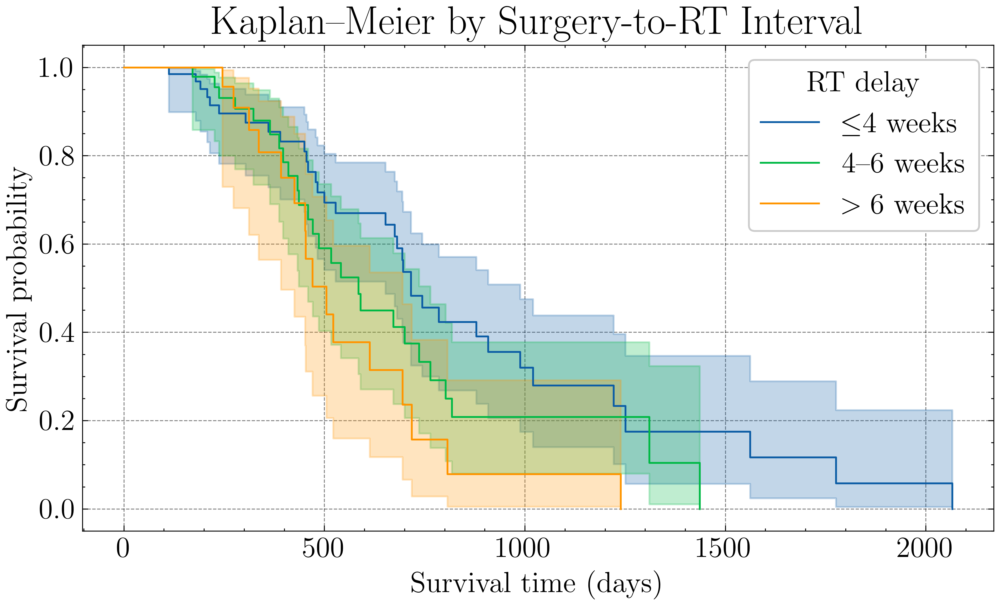

Number of patients included: 170
Number of events observed: 76
Number of censored patients: 94


In [70]:

from lifelines.statistics import multivariate_logrank_test, pairwise_logrank_test
# 3) Define the three delay‐categories exactly as Blakstad et al.
max_delay = clinical_data['Days_between_surgery_and_RT'].max()
bins = [-np.inf, 28, 42, max_delay]
labels = [r'$\leq$4 weeks', '4–6 weeks', r'$>6$ weeks']  # LaTeX-friendly labels
clinical_data['RT_delay_cat'] = pd.cut(
    clinical_data['Days_between_surgery_and_RT'],
    bins=bins, labels=labels
)

# 4) Bootstrap medians + 95% CI per category
median_ci = {}
for cat in labels:
    surv = clinical_data.loc[clinical_data['RT_delay_cat'] == cat, 'combined_survival'].dropna()
    boot_meds = [surv.sample(frac=1, replace=True, random_state=random_seed+i).median() for i in range(1000)]
    median = np.median(boot_meds)
    ci_lower, ci_upper = np.percentile(boot_meds, [2.5, 97.5])
    median_ci[cat] = (median, ci_lower, ci_upper)

print("Median survival (days) by delay category (95% CI):")
print(pd.DataFrame.from_dict(
    median_ci, orient='index',
    columns=['median', 'CI 2.5%', 'CI 97.5%']
))

# 5) Overall (multivariate) log-rank test
overall = multivariate_logrank_test(
    clinical_data['combined_survival'],
    clinical_data['RT_delay_cat'],
    clinical_data['event_observed']
)
print("\nOverall log-rank test:")
print(overall.summary[['test_statistic', 'p']])

# Print significance statement
overall_p = overall.summary['p'].values[0]
if overall_p < 0.05:
    print("→ Significant at the p < 0.05 level.")
else:
    print("→ Not significant at the p < 0.05 level.")

# 6) Pairwise log-rank tests
pairwise = pairwise_logrank_test(
    clinical_data['combined_survival'],
    clinical_data['RT_delay_cat'],
    clinical_data['event_observed']
)
print("\nPairwise log-rank p-values:")
print(pairwise.summary['p'])

# Print significance for each pair
print("\nSignificance (p < 0.05) for pairwise comparisons:")
for idx, pval in pairwise.summary['p'].items():
    comparison = f"{idx[0]} vs {idx[1]}"
    signif = "Significant" if pval < 0.05 else "Not significant"
    print(f"→ {comparison}: p = {pval:.4f} → {signif}")

# 7) (Bonus) Plot KM curves
kmf = KaplanMeierFitter()
plt.figure(figsize=(8, 5))
for cat in labels:
    ix = clinical_data['RT_delay_cat'] == cat
    kmf.fit(
        clinical_data.loc[ix, 'combined_survival'],
        event_observed=clinical_data.loc[ix, 'event_observed'],
        label=cat
    )
    kmf.plot_survival_function(ci_show=True)

plt.title('Kaplan–Meier by Surgery-to-RT Interval')
plt.xlabel('Survival time (days)')
plt.ylabel('Survival probability')
plt.legend(title='RT delay')
plt.tight_layout()
plt.savefig('Bilder/KM_by_RT_delay.pdf')
plt.show()
# 8) Summary of patient inclusion and censoring
n_patients = clinical_data.shape[0]
n_events = clinical_data['event_observed'].sum()
n_censored = n_patients - n_events

print(f"Number of patients included: {n_patients}")
print(f"Number of events observed: {n_events}")
print(f"Number of censored patients: {n_censored}")

=== Pearson correlation between age and surgery-to-RT delay ===
r = 0.08,  p = 3.211e-01


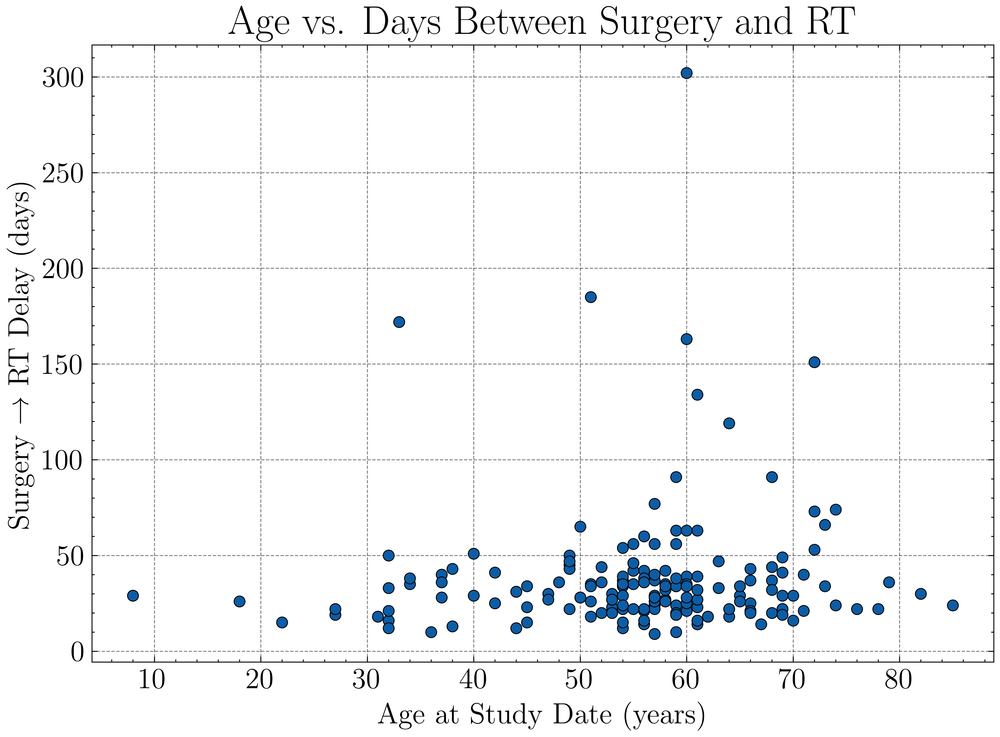

In [71]:

subset = clinical_data[['AgeAtStudyDate', 'Days_between_surgery_and_RT']].dropna()
r, p = pearsonr(subset['AgeAtStudyDate'], subset['Days_between_surgery_and_RT'])
print("=== Pearson correlation between age and surgery-to-RT delay ===")
print(f"r = {r:.2f},  p = {p:.3e}")

plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='AgeAtStudyDate',
    y='Days_between_surgery_and_RT',
    data=subset,
    edgecolor='black'
)
plt.title('Age vs. Days Between Surgery and RT')
plt.xlabel('Age at Study Date (years)')
plt.ylabel('Surgery → RT Delay (days)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [72]:
filtered_data.to_csv('filtered_data_survival.csv', index=False)


Class distribution in the target variable (Train set):
Survived_Over_600_Days
False    36
True     36
Name: count, dtype: int64

Number of occurrences per category in categorical features:

Sex:
Sex
M    42
F    30
Name: count, dtype: int64

IDH1/2:
IDH1/2
negative    39
unknown     27
positive     6
Name: count, dtype: int64

MGMT:
MGMT
unknown     33
negative    21
positive    18
Name: count, dtype: int64

Number of missing values per column (Train set):
AgeAtStudyDate                 0
Sex                            0
IDH1/2                         0
MGMT                           0
prescription_dose              0
num_fractions                  0
max_dose                       0
V95                            0
V90                            0
V50                            0
V1                             0
mean_dose                      0
brainstem_volume_cm3           0
brainstem_mean_dose            0
brainstem_max_dose             0
Days_between_surgery_and_RT    0
dtype: int

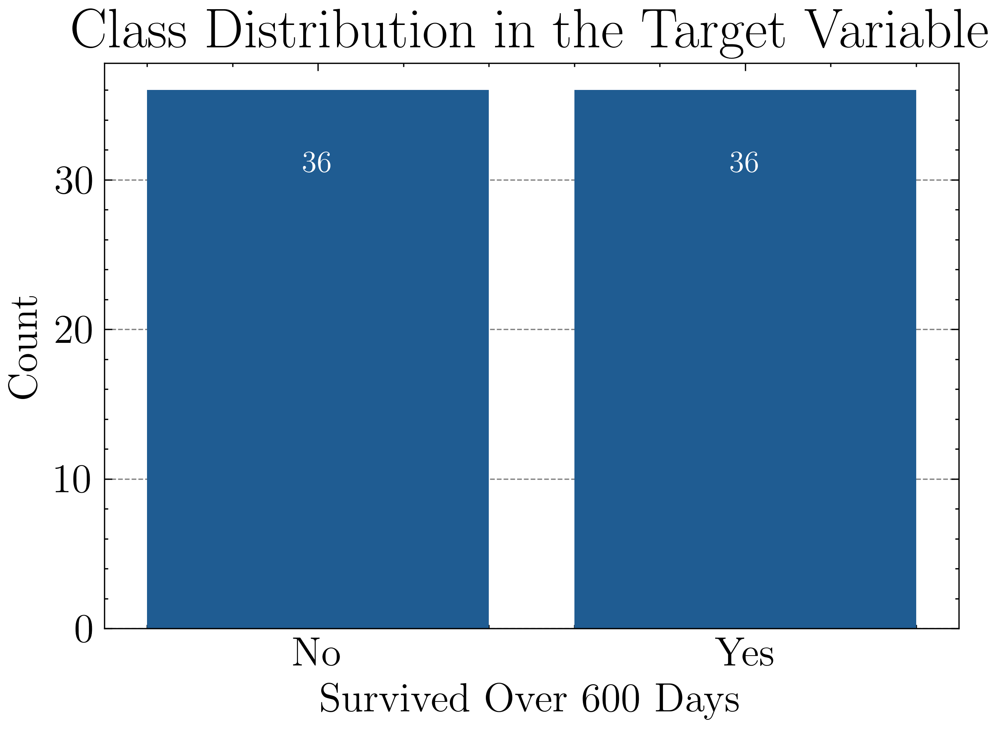

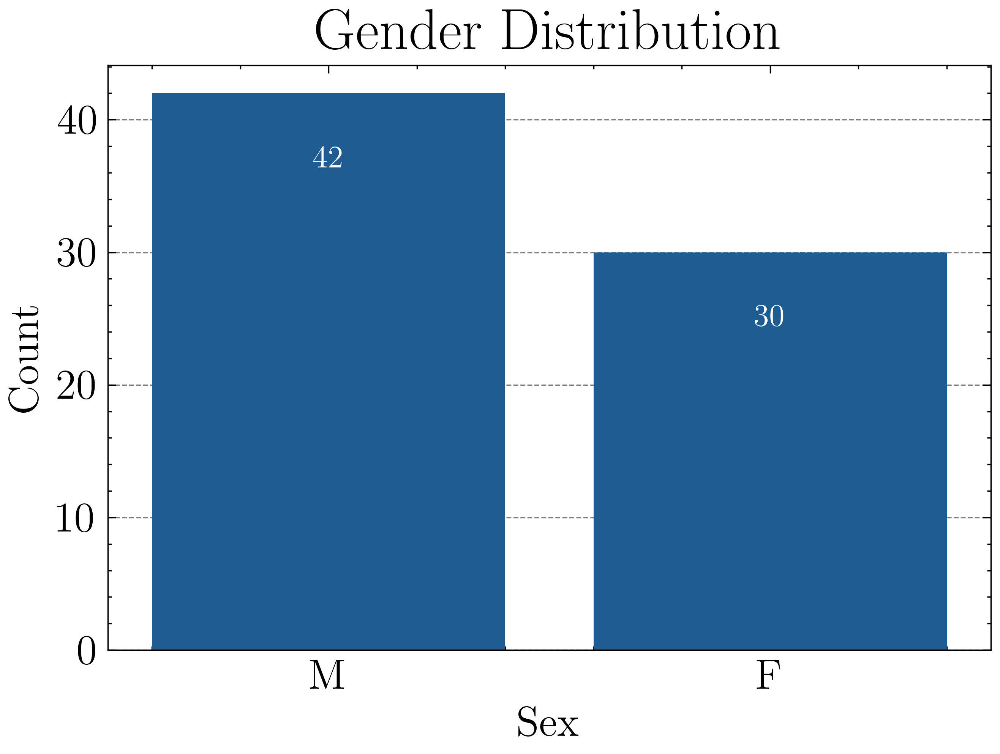

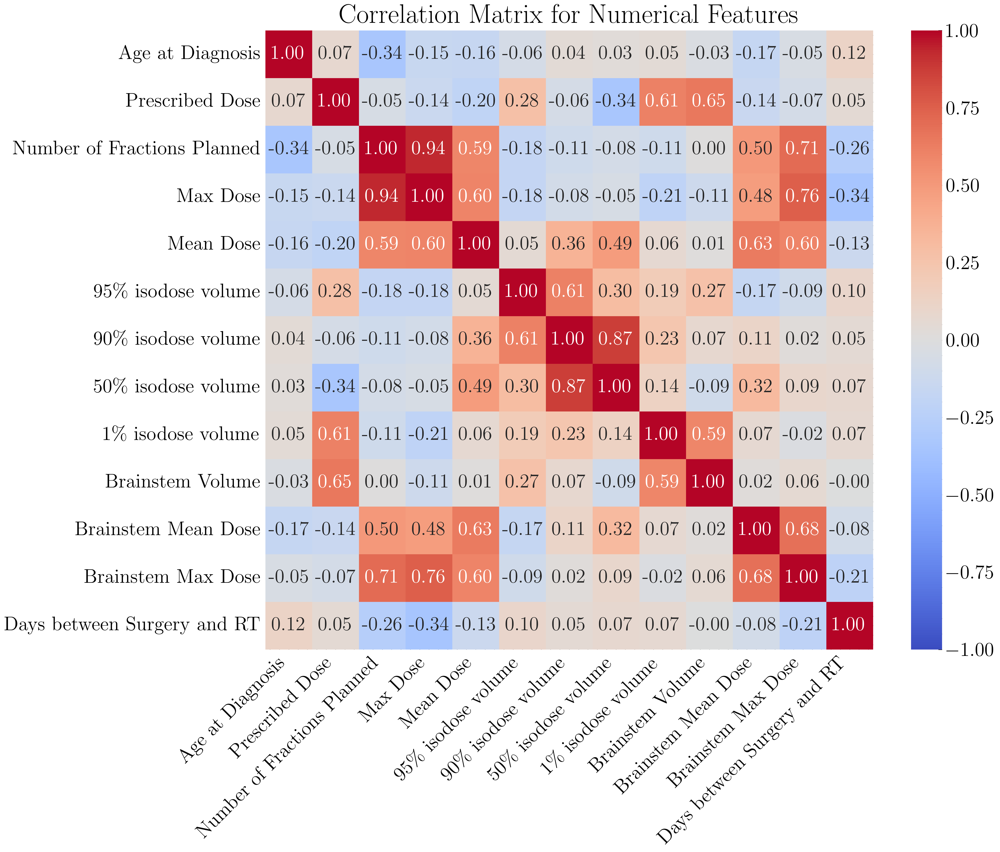


Number of unique values per column (Train set):
AgeAtStudyDate                 35
Sex                             2
IDH1/2                          3
MGMT                            3
prescription_dose               7
num_fractions                   9
max_dose                       72
V95                            72
V90                            72
V50                            72
V1                             72
mean_dose                      72
brainstem_volume_cm3           72
brainstem_mean_dose            72
brainstem_max_dose             72
Days_between_surgery_and_RT    38
dtype: int64

Train set size: 72
Test set size: 18

Class distribution in the training set:
Survived_Over_600_Days
False    36
True     36
Name: count, dtype: int64

Class distribution in the test set:
Survived_Over_600_Days
False    9
True     9
Name: count, dtype: int64

The column 'Progression' does not exist in the dataset.


In [73]:
# -----------------------------------------------------------
# 1. Definer features og target for datasettet
# -----------------------------------------------------------
features = [
    'AgeAtStudyDate', 'Sex', 'IDH1/2', 'MGMT',
    'prescription_dose', 'num_fractions', 'max_dose',
    'V95', 'V90', 'V50', 'V1', 'mean_dose',
    'brainstem_volume_cm3', 'brainstem_mean_dose', 'brainstem_max_dose',
    'Days_between_surgery_and_RT'
]
# Check om alle features finnes i datasettet
missing_features = [feat for feat in features if feat not in filtered_data.columns]
if missing_features:
    print(f"The following features are missing in the dataset: {missing_features}")
    exit()

# Velg features og target fra treningssettet (bruk samme til testsettet senere)
X = filtered_data[features]
y = filtered_data['Survived_Over_600_Days']
# Split the dataset using test_ids (assuming the patient IDs are stored in the 'AnonymPatientID' column)
test_mask = filtered_data['AnonymPatientID'].isin(test_ids)

X_test = filtered_data.loc[test_mask, features]
y_test = filtered_data.loc[test_mask, 'Survived_Over_600_Days']

X_train = filtered_data.loc[~test_mask, features]
y_train = filtered_data.loc[~test_mask, 'Survived_Over_600_Days']

# -----------------------------------------------------------
# Mapping fra originale feature-navn til mer beskrivende navn for plotting
# -----------------------------------------------------------
feature_label_mapping = {
    'AgeAtStudyDate': 'Age at Diagnosis',
    'Sex': 'Sex',
    'IDH1/2': 'Genetic Markers (IDH1/2 and MGMT)',
    'MGMT': 'Genetic Markers (IDH1/2 and MGMT)',
    'prescription_dose': 'Prescribed Dose',
    'mean_dose': 'Mean Dose',
    'max_dose': 'Max Dose',
    'num_fractions': 'Number of Fractions Planned',
    'brainstem_volume_cm3': 'Brainstem Volume',
    'brainstem_mean_dose': 'Brainstem Mean Dose',
    'brainstem_max_dose': 'Brainstem Max Dose',
    'V95': '95\% isodose volume',
    'V90': '90\% isodose volume',
    'V50': '50\% isodose volume',
    'V1': '1\% isodose volume',
    'Survived_Over_600_Days': 'Survived Over 600 Days',
    'Days_between_surgery_and_RT': 'Days between Surgery and RT'
}

# -----------------------------------------------------------
# 2. Utforsk og visualiser data for treningssettet
# -----------------------------------------------------------
# 2.1 Count class distribution
y_counts = y_train.value_counts()
print("\nClass distribution in the target variable (Train set):")
print(y_counts)

# 2.2 Definer kategoriske og numeriske features
categorical_features = ['Sex', 'IDH1/2', 'MGMT']
numerical_features = [
    'AgeAtStudyDate', 'prescription_dose', 'num_fractions',
    'max_dose', 'mean_dose', 'V95', 'V90', 'V50', 'V1', 
    'brainstem_volume_cm3', 'brainstem_mean_dose', 'brainstem_max_dose',
    'Days_between_surgery_and_RT'
]
# Sjekk om alle kategoriske og numeriske features er tilstede
missing_categorical = [feat for feat in categorical_features if feat not in X_train.columns]
missing_numerical = [feat for feat in numerical_features if feat not in X_train.columns]

if missing_categorical:
    print(f"The following categorical features are missing: {missing_categorical}")
    exit()

if missing_numerical:
    print(f"The following numerical features are missing: {missing_numerical}")
    exit()

# 2.3 Antall forekomster per kategori i treningssettets kategoriske features
print("\nNumber of occurrences per category in categorical features:")
for col in categorical_features:
    counts = X_train[col].value_counts(dropna=False)
    print(f"\n{col}:\n{counts}")

# 2.4 Tell antall manglende verdier per kolonne
print("\nNumber of missing values per column (Train set):")
missing_values = X_train.isnull().sum()
print(missing_values)

# 2.5 Kombinasjonsfordeling for de kategoriske variablene
print("\nCombination distribution of categorical variables ('Sex', 'IDH1/2', 'MGMT'):")
combination_counts = X_train.groupby(['Sex', 'IDH1/2', 'MGMT']).size().reset_index(name='Counts')
print(combination_counts)

# -----------------------------------------------------------
# 3. Visualisering av data
# -----------------------------------------------------------
# 3.1 Visualiser klassettingen i target-variabelen for treningssettet
plt.figure(figsize=(6,4))
ax = sns.countplot(x=y_train)
plt.title('Class Distribution in the Target Variable')
plt.xlabel(feature_label_mapping.get('Survived_Over_600_Days', 'Survived Over 600 Days'))
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['No', 'Yes'])  # Forutsatt binær klassifisering

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width()/2., p.get_height()-5),
                ha='center', va='center', color='white', fontsize=12)
plt.show()

# 3.2 Visualiser antall forekomster per kategori i 'Sex'
plt.figure(figsize=(6,4))
ax = sns.countplot(x=X_train['Sex'])
plt.title('Gender Distribution')
plt.xlabel(feature_label_mapping.get('Sex', 'Sex'))
plt.ylabel('Count')

for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width()/2., p.get_height()-5),
                ha='center', va='center', color='white', fontsize=12)
plt.show()

# 3.3 Visualiser korrelasjonsmatrise for de numeriske features
plt.figure(figsize=(12, 10))
corr_matrix = X_train[numerical_features].corr()
corr_matrix_renamed = corr_matrix.rename(index=feature_label_mapping, columns=feature_label_mapping)

sns.heatmap(corr_matrix_renamed, annot=True, cmap='coolwarm', fmt=".2f", 
            vmin=-1, vmax=1, center=0)
plt.title('Correlation Matrix for Numerical Features')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('Bilder/correlation_matrix_numerical_features_ST.pdf')
plt.show()

# 3.4 Skriv ut antall unike verdier per kolonne
print("\nNumber of unique values per column (Train set):")
unique_values = X_train.nunique()
print(unique_values)

# -----------------------------------------------------------
# 4. Oppsett av preprosesseringspipeline
# -----------------------------------------------------------
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline([
            ('imputer', SimpleImputer(strategy='mean')),  # Fyll inn manglende numeriske verdier med gjennomsnitt
            ('scaler', StandardScaler())
        ]), numerical_features),
        ('cat', Pipeline([
            ('imputer', SimpleImputer(strategy='constant', fill_value='Missing')),
            ('onehot', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ]
)

# -----------------------------------------------------------
# 5. Visning av klassefordelingen i testsettet
# -----------------------------------------------------------
print(f"\nTrain set size: {X_train.shape[0]}")
print(f"Test set size: {X_test.shape[0]}")

train_counts = y_train.value_counts()
print("\nClass distribution in the training set:")
print(train_counts)

test_counts = y_test.value_counts()
print("\nClass distribution in the test set:")
print(test_counts)

# 6. Eksempel på å telle forekomster for andre kolonner (f.eks. 'Progression')
if 'Progression' in filtered_data.columns:
    progression_counts = filtered_data['Progression'].value_counts(dropna=False)
    print("\nClass distribution in 'Progression':")
    print(progression_counts)
else:
    print("\nThe column 'Progression' does not exist in the dataset.")


Training RandomForest...
Best hyperparameters for RandomForest: {'clf__max_depth': None, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 1, 'clf__min_samples_split': 2, 'clf__n_estimators': 100}
Best cross-validation accuracy for RandomForest: 0.7067

Training SVC...
Best hyperparameters for SVC: {'clf__C': 1, 'clf__gamma': 0.1, 'clf__kernel': 'rbf'}
Best cross-validation accuracy for SVC: 0.6648

Training GradientBoosting...
Best hyperparameters for GradientBoosting: {'clf__learning_rate': 0.01, 'clf__max_depth': 3, 'clf__max_features': None, 'clf__min_samples_leaf': 1, 'clf__n_estimators': 100, 'clf__subsample': 1.0}
Best cross-validation accuracy for GradientBoosting: 0.7229

Training LogisticRegression...
Best hyperparameters for LogisticRegression: {'clf__C': 1, 'clf__class_weight': 'balanced', 'clf__penalty': 'l2', 'clf__solver': 'saga'}
Best cross-validation accuracy for LogisticRegression: 0.5971

Training LinearRegression...


/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/linear_model/_sag.py:349: Convergence

Best hyperparameters for LinearRegression: {'clf__C': 0.1, 'clf__penalty': 'l2', 'clf__solver': 'saga'}
Best cross-validation accuracy for LinearRegression: 0.6095

Training XGBoost...
Best hyperparameters for XGBoost: {'clf__colsample_bytree': 0.6, 'clf__gamma': 0, 'clf__learning_rate': 0.1, 'clf__max_depth': 6, 'clf__min_child_weight': 0, 'clf__n_estimators': 200}
Best cross-validation accuracy for XGBoost: 0.7771

Training LightGBM...
[LightGBM] [Info] Number of positive: 29, number of negative: 29
[LightGBM] [Info] Number of positive: 29, number of negative: 28
[LightGBM] [Info] Number of positive: 29, number of negative: 29
[LightGBM] [Info] Number of positive: 29, number of negative: 29[LightGBM] [Info] Number of positive: 28, number of negative: 29[LightGBM] [Info] Number of positive: 29, number of negative: 29
[LightGBM] [Info] Number of positive: 29, number of negative: 29


[LightGBM] [Info] Number of positive: 29, number of negative: 28
[LightGBM] [Info] Number of positive: 

/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning:

Best hyperparameters for AdaBoost: {'clf__learning_rate': 0.1, 'clf__n_estimators': 50}
Best cross-validation accuracy for AdaBoost: 0.6400

Training KNN...
Best hyperparameters for KNN: {'clf__metric': 'euclidean', 'clf__n_neighbors': 5, 'clf__weights': 'uniform'}
Best cross-validation accuracy for KNN: 0.5943

Training MLP...


/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/aleksanderbechlund/opt/anaconda3/envs/conda310/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maxim

Best hyperparameters for MLP: {'clf__activation': 'tanh', 'clf__alpha': 0.0001, 'clf__hidden_layer_sizes': (50,), 'clf__learning_rate': 'constant', 'clf__solver': 'adam'}
Best cross-validation accuracy for MLP: 0.6257

Summary of model tuning results:
                 Model  Avg Val Score  Avg Val Loss  \
0         RandomForest       0.706667      0.293333   
1                  SVC       0.664762      0.335238   
2     GradientBoosting       0.722857      0.277143   
3   LogisticRegression       0.597143      0.402857   
4     LinearRegression       0.609524      0.390476   
5              XGBoost       0.777143      0.222857   
6             LightGBM       0.625714      0.374286   
7             CatBoost       0.625714      0.374286   
8           ExtraTrees       0.583810      0.416190   
9             AdaBoost       0.640000      0.360000   
10                 KNN       0.594286      0.405714   
11                 MLP       0.625714      0.374286   

                                

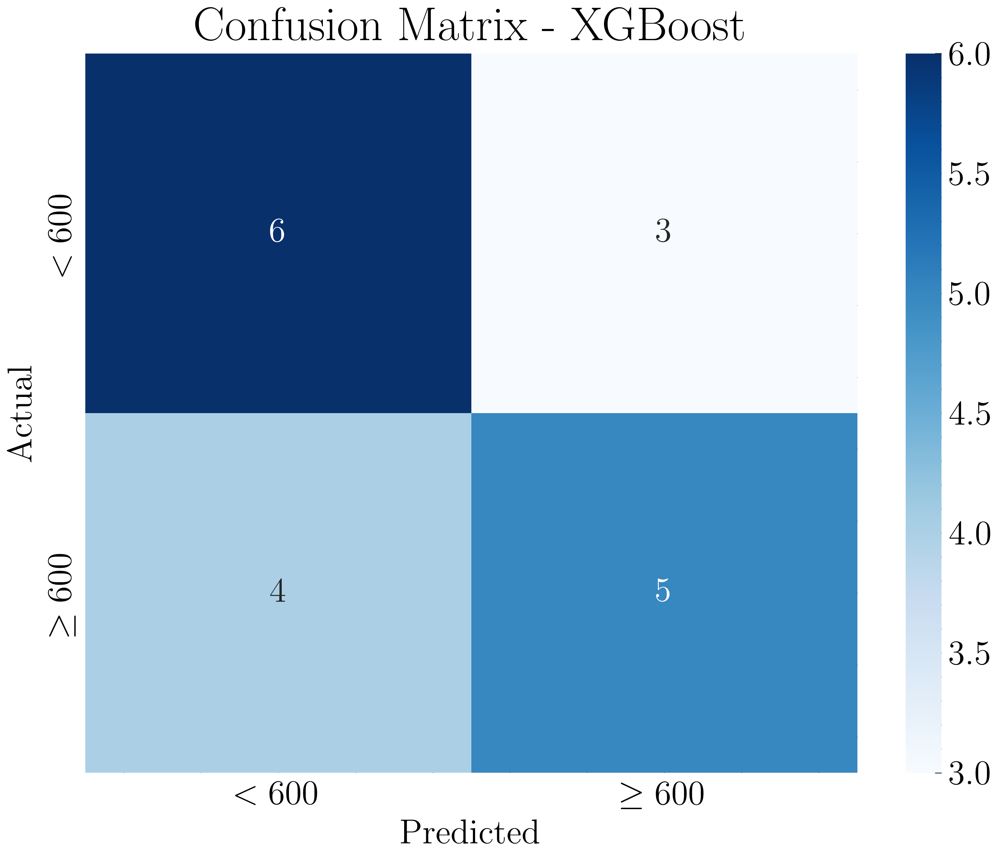

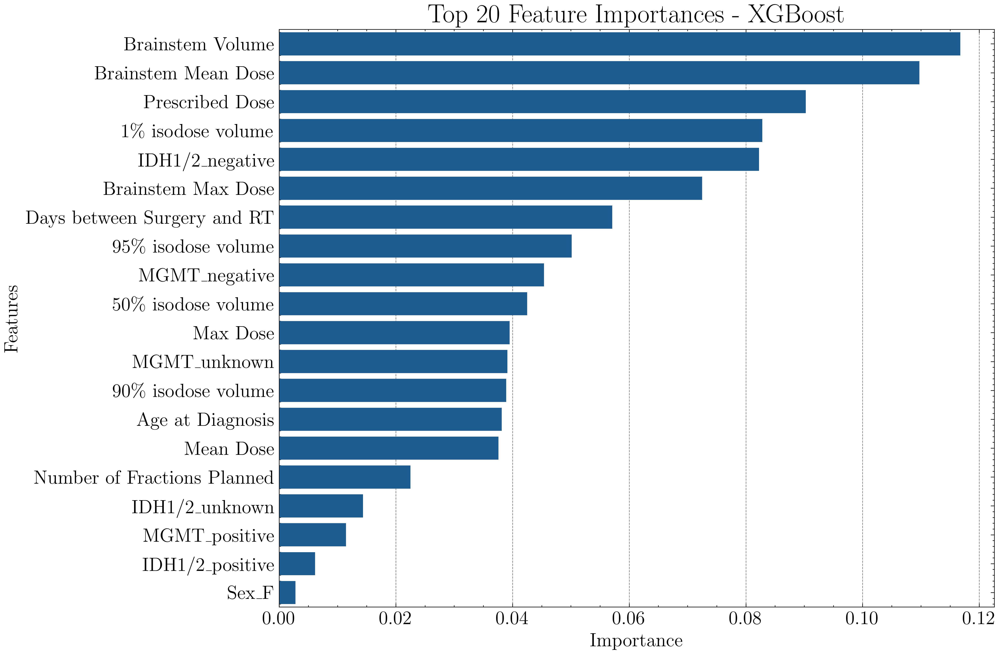

In [74]:
# Define which features are numerical and categorical
numerical_features = [
    'AgeAtStudyDate', 'prescription_dose', 'num_fractions',
    'max_dose', 'mean_dose', 'V95', 'V90', 'V50', 'V1', 
    'brainstem_volume_cm3', 'brainstem_mean_dose', 'brainstem_max_dose',
    'Days_between_surgery_and_RT'
]
categorical_features = ['Sex', 'IDH1/2', 'MGMT']

# ---------------------------
# Function: Create Preprocessing Pipeline
# ---------------------------
def create_preprocessor(numerical_features, categorical_features):
    """
    Creates a ColumnTransformer for numerical and categorical features.
    """
    categorical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='constant', fill_value='Missing')),
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])

    numerical_pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('scaler', StandardScaler())
    ])

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_pipeline, numerical_features),
            ('cat', categorical_pipeline, categorical_features)
        ]
    )
    
    return preprocessor

# ---------------------------
# 3. Model and Parameter Grid Definitions
# ---------------------------
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
def get_models(random_seed):
    """
    Returns a list of models to be tested.
    """
    return [
        ('RandomForest', RandomForestClassifier(random_state=random_seed)),
        ('SVC', SVC(probability=True, random_state=random_seed)),
        ('GradientBoosting', GradientBoostingClassifier(random_state=random_seed)),
        ('LogisticRegression', LogisticRegression(random_state=random_seed, solver='saga')),
        ('LinearRegression', LogisticRegression(random_state=random_seed, solver='saga')),
        ('XGBoost', XGBClassifier(eval_metric='logloss', random_state=random_seed)),
        ('LightGBM', LGBMClassifier(random_state=random_seed)),
        ('CatBoost', CatBoostClassifier(verbose=0, random_state=random_seed)),
        ('ExtraTrees', ExtraTreesClassifier(random_state=random_seed)),
        ('AdaBoost', AdaBoostClassifier(random_state=random_seed)),
        ('KNN', KNeighborsClassifier()),
        ('MLP', MLPClassifier(random_state=random_seed))
    ]

def get_param_grids():
    """
    Returns parameter grids for hyperparameter tuning.
    Note: Feature selection and dimensionality reduction have been removed.
    """
    return {
        'RandomForest': {
            'clf__n_estimators': [100, 200],
            'clf__max_depth': [None, 10, 20],
            'clf__min_samples_split': [2, 5],
            'clf__min_samples_leaf': [1, 2],
            'clf__max_features': ['sqrt', 'log2', None]
        },
        'SVC': {
            'clf__C': [0.01, 0.5, 1],
            'clf__gamma': [1, 0.1],
            'clf__degree': [2, 3]  # Only used for poly kernel
        },
        'GradientBoosting': {
            'clf__n_estimators': [100, 200, 500],
            'clf__learning_rate': [0.01, 0.1],
            'clf__max_depth': [3, 5],
            'clf__min_samples_leaf': [1, 2],
            'clf__subsample': [0.8, 1.0],
            'clf__max_features': [None, 'sqrt', 'log2']
        },
        'LinearRegression': {
            'clf__penalty': ['l1', 'l2'],
            'clf__C': [0.1, 1],
            'clf__solver': ['saga'],
        },
        'LogisticRegression': {
            'clf__penalty': ['l1', 'l2'],
            'clf__C': [0.1, 1],
            'clf__solver': ['saga'],
            'clf__class_weight': ['balanced']
        },
        'XGBoost': {
            'clf__n_estimators': [100, 200, 300, 500],
            'clf__learning_rate': [0.001, 0.01, 0.05, 0.1],
            'clf__max_depth': [3, 4, 5, 6],
            'clf__colsample_bytree': [0.6, 0.8, 1.0],
            'clf__gamma': [0, 0.1, 0.2],
            'clf__min_child_weight': [0, 1, 5, 10]
        },
        'LightGBM': {
            'clf__n_estimators': [100, 200],
            'clf__max_depth': [-1, 10],
            'clf__learning_rate': [0.01, 0.1],
            'clf__num_leaves': [31, 50],
            'clf__boosting_type': ['gbdt', 'dart'],
            'clf__colsample_bytree': [0.8, 1.0]
        },
        'CatBoost': {
            'clf__iterations': [100, 200, 300],
            'clf__depth': [3, 5, 10],
            'clf__learning_rate': [0.01, 0.1],
            'clf__l2_leaf_reg': [1, 5]
        },
        'ExtraTrees': {
            'clf__n_estimators': [100, 200],
            'clf__max_depth': [None, 10],
            'clf__min_samples_split': [2, 5],
            'clf__min_samples_leaf': [1, 2],
            'clf__max_features': ['sqrt', 'log2', None]
        },
        'AdaBoost': {
            'clf__n_estimators': [50, 100],
            'clf__learning_rate': [0.01, 0.1]
        },
        'KNN': {
            'clf__n_neighbors': [3, 5],
            'clf__weights': ['uniform', 'distance'],
            'clf__metric': ['euclidean', 'manhattan']
        },
        'MLP': {
            'clf__hidden_layer_sizes': [(50,), (100,)],
            'clf__activation': ['relu', 'tanh'],
            'clf__solver': ['adam'],
            'clf__alpha': [0.0001, 0.001],
            'clf__learning_rate': ['constant', 'adaptive']
        }
    }

# ---------------------------
# 4. Model Tuning and Selection
# ---------------------------
def tune_and_select_best_model(models, param_grids, preprocessor, X_train_val, y_train_val, random_seed):
    """
    Tunes hyperparameters for each model using cross-validation and returns the best model.
    """
    best_model = None
    best_score = -np.inf
    best_name = ""
    best_params = {}
    
    results_table = []
    cv_strategy = StratifiedKFold(n_splits=5, shuffle=True, random_state=random_seed)
    
    for name, model in models:
        print(f"\nTraining {name}...")
        
        # Build pipeline with preprocessor and classifier
        steps = [
            ('preprocessor', preprocessor),
            ('clf', model)
        ]
        pipeline = ImbPipeline(steps=steps)

        # Get parameter grid for the model
        param_grid = param_grids[name]

        # Handle special cases for SVC and LogisticRegression
        if name == 'SVC':
            param_grid_combined = []
            kernels = ['rbf', 'linear', 'sigmoid', 'poly']
            for kernel in kernels:
                params = {k: v for k, v in param_grid.items() if k != 'clf__degree'}
                params['clf__kernel'] = [kernel]
                if kernel == 'poly':
                    params['clf__degree'] = [2, 3]
                param_grid_combined.append(params)
        elif name == 'LogisticRegression':
            param_grid_combined = []
            penalties = ['l1', 'l2']
            for penalty in penalties:
                params = {k: v for k, v in param_grid.items() if k != 'clf__l1_ratio'}
                params['clf__penalty'] = [penalty]
                param_grid_combined.append(params)
        else:
            param_grid_combined = param_grid

        try:
            grid_search = GridSearchCV(
                pipeline, 
                param_grid_combined, 
                cv=cv_strategy, 
                scoring='accuracy',
                n_jobs=-1,
                verbose=0
            )
            
            grid_search.fit(X_train_val, y_train_val)
            
            avg_val_score = grid_search.best_score_
            avg_val_loss = 1 - avg_val_score
            
            print(f"Best hyperparameters for {name}: {grid_search.best_params_}")
            print(f"Best cross-validation accuracy for {name}: {avg_val_score:.4f}")
            
            results_table.append({
                'Model': name,
                'Avg Val Score': avg_val_score,
                'Avg Val Loss': avg_val_loss,
                'Best Params': grid_search.best_params_
            })
            
            if avg_val_score > best_score:
                best_model = grid_search.best_estimator_
                best_score = avg_val_score
                best_name = name
                best_params = grid_search.best_params_
        
        except Exception as e:
            print(f"Grid search failed for {name} with error: {e}\n")
    
    results_df = pd.DataFrame(results_table)
    print("\nSummary of model tuning results:")
    print(results_df)
    
    print(f"\nThe best model is {best_name} with a cross-validation accuracy of {best_score:.4f}")
    return best_model, best_name, best_score, best_params

# ---------------------------
# 5. Model Evaluation
# ---------------------------
def evaluate_model(model, X_test, y_test, best_name, numerical_features, categorical_features):
    """
    Evaluates the best model and visualizes the results.
    Since we are not using dimensionality reduction, feature importance can be visualized directly.
    """
    y_pred = model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)[:,1] if hasattr(model, "predict_proba") else None
    accuracy = accuracy_score(y_test, y_pred)
    bal_accuracy = balanced_accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred_proba) if y_pred_proba is not None else "N/A"
    
    print(f"\nBest Model: {best_name}")
    print(f"Test Accuracy: {accuracy:.4f}")
    print(f"Test Balanced Accuracy: {bal_accuracy:.4f}")
    print(f"Test F1-score: {f1:.4f}")
    print(f"Test Precision: {precision:.4f}")
    print(f"Test Recall: {recall:.4f}")
    print(f"Test ROC-AUC: {roc_auc}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    # Plotting the confusion matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=[r'$<600$', r'$\geq600$'], 
                yticklabels=[r'$<600$', r'$\geq600$'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f"Confusion Matrix - {best_name}")
    plt.savefig(f'Bilder/confusion_matrix{best_name}_ST.pdf')
    plt.show()

        
    # Visualize feature importance for models that support this
    if best_name in ['RandomForest', 'GradientBoosting', 'XGBoost', 'LightGBM', 'CatBoost', 'ExtraTrees', 'AdaBoost']:
        # Retrieve the original feature names after preprocessing
        if categorical_features:
            ohe = model.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot']
            ohe_features = ohe.get_feature_names_out(categorical_features)
            all_features = numerical_features + list(ohe_features)
        else:
            all_features = numerical_features

        try:
            importances = model.named_steps['clf'].feature_importances_
            feature_importances = pd.Series(importances, index=all_features).sort_values(ascending=False)
            
            # Map feature names using feature_label_mapping if available
            feature_importances.index = [feature_label_mapping.get(feat, feat) for feat in feature_importances.index]
            
            plt.figure(figsize=(12, 8))
            sns.barplot(x=feature_importances[:20], y=feature_importances.index[:20])
            plt.title(f"Top 20 Feature Importances - {best_name}")
            plt.xlabel('Importance')
            plt.ylabel('Features')
            plt.tight_layout()
            plt.savefig(f'Bilder/feature_importances_{best_name}_ST.pdf')
            plt.show()
        except AttributeError:
            print(f"{best_name} does not have the attribute 'feature_importances_'.")
    
    elif best_name in ['LogisticRegression', 'MLP', 'LinearRegression']:
        if hasattr(model.named_steps['clf'], 'coef_'):
            coefficients = model.named_steps['clf'].coef_[0]
            if categorical_features:
                ohe = model.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot']
                ohe_features = ohe.get_feature_names_out(categorical_features)
                all_features = numerical_features + list(ohe_features)
            else:
                all_features = numerical_features
            coef_series = pd.Series(coefficients, index=all_features).sort_values(key=abs, ascending=False)
            
            # Map feature names using feature_label_mapping if available
            coef_series.index = [real_names.get(feat, feat) for feat in coef_series.index]
            
            plt.figure(figsize=(12, 8))
            sns.barplot(x=coef_series[:20], y=coef_series.index[:20])
            plt.title(f"Top 20 Feature Coefficients - {best_name}")
            plt.xlabel('Coefficient Value')
            plt.ylabel('Features')
            plt.tight_layout()
            plt.savefig(f'Bilder/feature_importances_{best_name}_ST.pdf')
            plt.show()
        else:
            print(f"{best_name} does not have the attribute 'coef_'.")
    
    elif best_name == 'SVC' and model.named_steps['clf'].kernel == 'linear':
        try:
            coefficients = model.named_steps['clf'].coef_[0]
            if categorical_features:
                ohe = model.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot']
                ohe_features = ohe.get_feature_names_out(categorical_features)
                all_features = numerical_features + list(ohe_features)
            else:
                all_features = numerical_features
            coef_series = pd.Series(coefficients, index=all_features).sort_values(key=abs, ascending=False)
            
            # Map feature names using feature_label_mapping if available
            coef_series.index = [real_names.get(feat, feat) for feat in coef_series.index]
            
            plt.figure(figsize=(12, 8))
            sns.barplot(x=coef_series[:20], y=coef_series.index[:20])
            plt.title(f"Top 20 Feature Coefficients - {best_name}")
            plt.xlabel('Coefficient Value')
            plt.ylabel('Features')
            plt.tight_layout()
            plt.savefig(f'Bilder/feature_importances_{best_name}_ST.pdf')
            plt.show()
        except AttributeError:
            print(f"{best_name} does not have the attribute 'coef_'.")
    else:
        print(f"{best_name} does not have available feature importance or coefficients for visualization.")
# ---------------------------
# 6. Main Execution
# ---------------------------
def main():
    # Check that X_train, X_test, y_train, and y_test are defined.
    global best_model, best_name, best_score, best_params  # Make these global
    # For this example, it is assumed that you have defined these variables beforehand.
    if 'X_train' not in globals() or 'X_test' not in globals() or 'y_train' not in globals() or 'y_test' not in globals():
        print("Please define 'X_train', 'X_test', 'y_train' and 'y_test' before running.")
        return
    
    preprocessor = create_preprocessor(numerical_features, categorical_features)
    
    # Define models and parameter grids
    models = get_models(random_seed)
    param_grids = get_param_grids()
    
    # Tune and select the best model
    best_model, best_name, best_score, best_params = tune_and_select_best_model(
        models, param_grids, preprocessor, X_train, y_train, random_seed
    )
    
    if best_model is not None:
        evaluate_model(best_model, X_test, y_test, best_name, numerical_features, categorical_features)
    else:
        print("No model was trained correctly.")

if __name__ == "__main__":
    main()

In [75]:
test_patient_ids = filtered_data.loc[X_test.index, "patient_id"].tolist()
print("Patient IDs in the test set:")
print(test_patient_ids)

Patient IDs in the test set:
[3, 28, 53, 105, 112, 115, 118, 166, 171, 14, 18, 35, 59, 71, 72, 77, 110, 125]


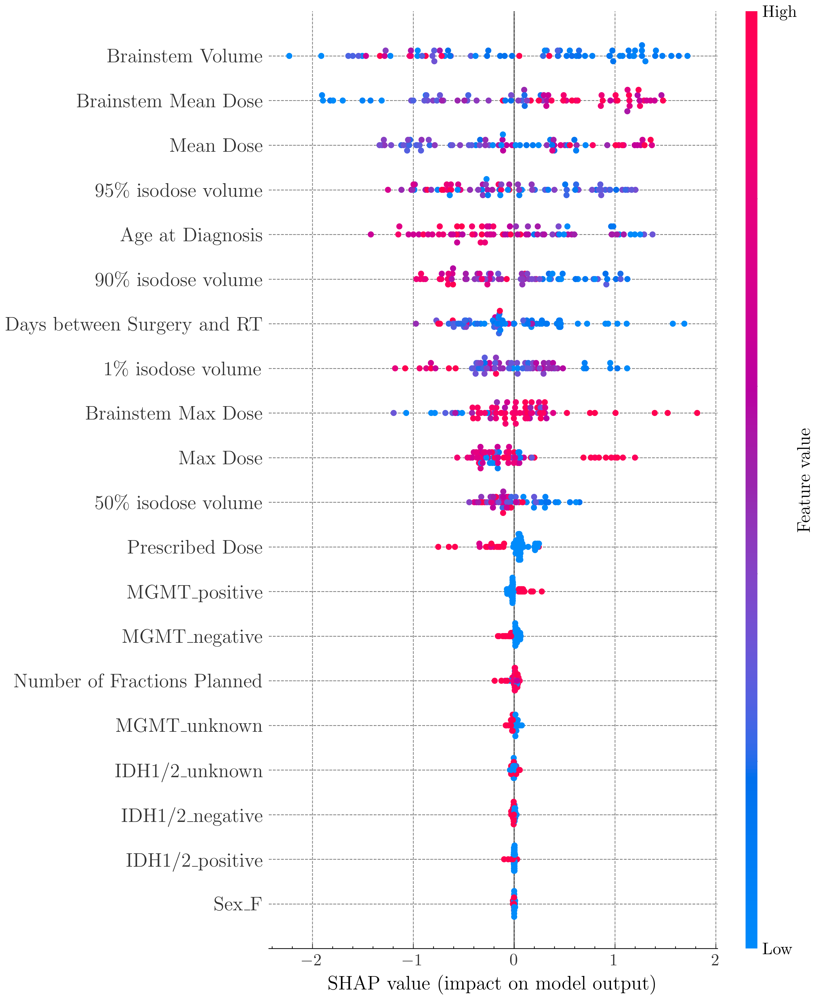

In [76]:
import shap
import matplotlib.pyplot as plt

def explain_xgboost(model, X_train, numerical_features, categorical_features):
    """
    Uses SHAP to explain the predictions of an XGBoost model.
    
    Parameters:
    - model: The trained pipeline (with preprocessor and XGBoost classifier).
    - X_train: The training data before preprocessing.
    - numerical_features: List of numerical feature names.
    - categorical_features: List of categorical feature names.
    """
    # Retrieve feature names after preprocessing
    if categorical_features:
        ohe = model.named_steps['preprocessor'].named_transformers_['cat'].named_steps['onehot']
        ohe_features = list(ohe.get_feature_names_out(categorical_features))
        all_features = numerical_features + ohe_features
    else:
        all_features = numerical_features

    # Map original feature names to their real names using feature_label_mapping
    real_feature_names = [feature_label_mapping.get(feat, feat) for feat in all_features]

    # Create a TreeExplainer for the XGBoost classifier
    explainer = shap.TreeExplainer(model.named_steps['clf'])
    
    # Transform the training data using the preprocessor
    X_train_transformed = model.named_steps['preprocessor'].transform(X_train)
    
    # Calculate SHAP values for the training set
    shap_values = explainer.shap_values(X_train_transformed)
    
    # Display and save the SHAP summary plot with real feature names
    plt.figure()
    shap.summary_plot(shap_values, X_train_transformed, feature_names=real_feature_names, show=True)
    plt.savefig("Bilder/SHAP_summary_plot.pdf", bbox_inches='tight')
    plt.close()


# Check that best_model and best_name are defined before proceeding
if 'best_name' in globals():
    if best_name == 'XGBoost':
        explain_xgboost(best_model, X_train, numerical_features, categorical_features)
    else:
        print(f"Best model is {best_name}. This cell is configured for XGBoost only.")
else:
    print("Variables 'best_model' and 'best_name' are not defined. Please run your training cell first.")


Median survival (days) by delay category (95% CI):
               median   CI 2.5%  CI 97.5%
$\leq$4 weeks   408.0  256.0000  513.0000
4–6 weeks       360.0  279.9875  434.5375
$>6$ weeks      304.0  237.0000  425.0000

Overall log-rank test:
   test_statistic         p
0        6.427335  0.040209
→ Significant at the p < 0.05 level.

Pairwise log-rank p-values:
$>6$ weeks     $\leq$4 weeks    0.016550
               4–6 weeks        0.189853
$\leq$4 weeks  4–6 weeks        0.156169
Name: p, dtype: float64

Significance (p < 0.05) for pairwise comparisons:
→ $>6$ weeks vs $\leq$4 weeks: p = 0.0166 → Significant
→ $>6$ weeks vs 4–6 weeks: p = 0.1899 → Not significant
→ $\leq$4 weeks vs 4–6 weeks: p = 0.1562 → Not significant


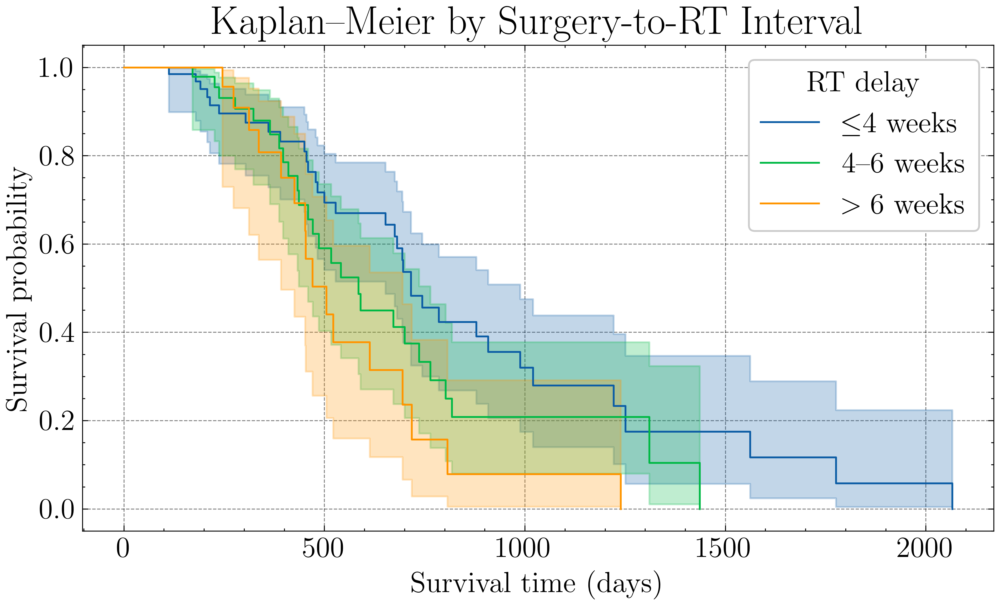

Number of patients included: 170
Number of events observed: 76
Number of censored patients: 94


In [77]:

from lifelines.statistics import multivariate_logrank_test, pairwise_logrank_test
# 3) Define the three delay‐categories exactly as Blakstad et al.
max_delay = clinical_data['Days_between_surgery_and_RT'].max()
bins = [-np.inf, 28, 42, max_delay]
labels = [r'$\leq$4 weeks', '4–6 weeks', r'$>6$ weeks']  # LaTeX-friendly labels
clinical_data['RT_delay_cat'] = pd.cut(
    clinical_data['Days_between_surgery_and_RT'],
    bins=bins, labels=labels
)

# 4) Bootstrap medians + 95% CI per category
median_ci = {}
for cat in labels:
    surv = clinical_data.loc[clinical_data['RT_delay_cat'] == cat, 'combined_survival'].dropna()
    boot_meds = [surv.sample(frac=1, replace=True, random_state=random_seed+i).median() for i in range(1000)]
    median = np.median(boot_meds)
    ci_lower, ci_upper = np.percentile(boot_meds, [2.5, 97.5])
    median_ci[cat] = (median, ci_lower, ci_upper)

print("Median survival (days) by delay category (95% CI):")
print(pd.DataFrame.from_dict(
    median_ci, orient='index',
    columns=['median', 'CI 2.5%', 'CI 97.5%']
))

# 5) Overall (multivariate) log-rank test
overall = multivariate_logrank_test(
    clinical_data['combined_survival'],
    clinical_data['RT_delay_cat'],
    clinical_data['event_observed']
)
print("\nOverall log-rank test:")
print(overall.summary[['test_statistic', 'p']])

# Print significance statement
overall_p = overall.summary['p'].values[0]
if overall_p < 0.05:
    print("→ Significant at the p < 0.05 level.")
else:
    print("→ Not significant at the p < 0.05 level.")

# 6) Pairwise log-rank tests
pairwise = pairwise_logrank_test(
    clinical_data['combined_survival'],
    clinical_data['RT_delay_cat'],
    clinical_data['event_observed']
)
print("\nPairwise log-rank p-values:")
print(pairwise.summary['p'])

# Print significance for each pair
print("\nSignificance (p < 0.05) for pairwise comparisons:")
for idx, pval in pairwise.summary['p'].items():
    comparison = f"{idx[0]} vs {idx[1]}"
    signif = "Significant" if pval < 0.05 else "Not significant"
    print(f"→ {comparison}: p = {pval:.4f} → {signif}")

# 7) (Bonus) Plot KM curves
kmf = KaplanMeierFitter()
plt.figure(figsize=(8, 5))
for cat in labels:
    ix = clinical_data['RT_delay_cat'] == cat
    kmf.fit(
        clinical_data.loc[ix, 'combined_survival'],
        event_observed=clinical_data.loc[ix, 'event_observed'],
        label=cat
    )
    kmf.plot_survival_function(ci_show=True)

plt.title('Kaplan–Meier by Surgery-to-RT Interval')
plt.xlabel('Survival time (days)')
plt.ylabel('Survival probability')
plt.legend(title='RT delay')
plt.tight_layout()
plt.savefig('Bilder/KM_by_RT_delay.pdf')
plt.show()
# 8) Summary of patient inclusion and censoring
n_patients = clinical_data.shape[0]
n_events = clinical_data['event_observed'].sum()
n_censored = n_patients - n_events

print(f"Number of patients included: {n_patients}")
print(f"Number of events observed: {n_events}")
print(f"Number of censored patients: {n_censored}")

=== Pearson correlation between age and surgery-to-RT delay ===
r = 0.08,  p = 3.211e-01


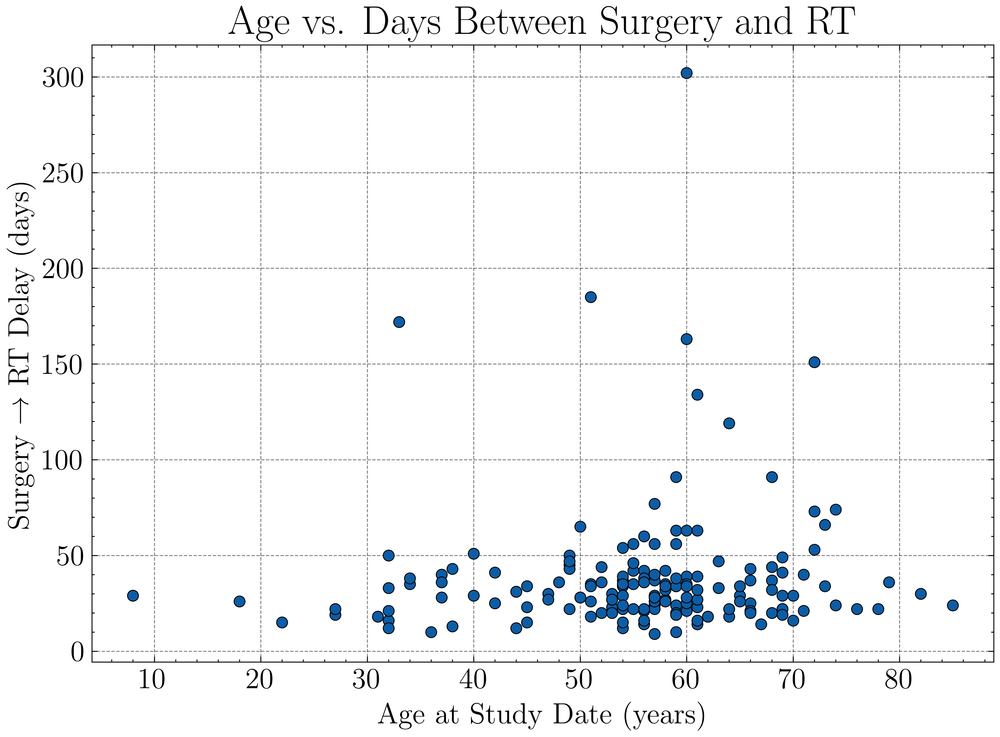

In [78]:
subset = clinical_data[['AgeAtStudyDate', 'Days_between_surgery_and_RT']].dropna()
r, p = pearsonr(subset['AgeAtStudyDate'], subset['Days_between_surgery_and_RT'])
print("=== Pearson correlation between age and surgery-to-RT delay ===")
print(f"r = {r:.2f},  p = {p:.3e}")

plt.figure(figsize=(8, 6))
sns.scatterplot(
    x='AgeAtStudyDate',
    y='Days_between_surgery_and_RT',
    data=subset,
    edgecolor='black'
)
plt.title('Age vs. Days Between Surgery and RT')
plt.xlabel('Age at Study Date (years)')
plt.ylabel('Surgery → RT Delay (days)')
plt.grid(True)
plt.tight_layout()
plt.show()